2022 Dec--this data is created by notebook: PTOBEPS_UsedinNMIpaper.ipynb

- Notebook by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- BEPFM and BEPS data acquired by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- Analyses by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- PTO sample from [Hiroshi Funakubo](https://scholar.google.co.jp/citations?user=12EJj9gAAAAJ&hl=ja)

- Project Sergei V. Kalinin, Rama Vasudevan, Maxim Ziatdinov, Yongtao Liu


## **Import and Download data**

In [1]:
#@title Install
!pip install -q git+https://github.com/pycroscopy/atomai.git
!pip install atomai
!pip install -q --upgrade git+https://github.com/ziatdinovmax/gpax
!pip install -U gdown

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 KB 401.6 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.1/503.1 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.8/865.8 KB 5.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.2/300.2 KB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.1/352.1 KB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 MB 19.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.

In [2]:
#@title Import
import numpy as np
import matplotlib.pyplot as plt
import gpax
import numpyro
import jax
import jax.numpy as jnp
import math
import atomai as aoi
import torch
import os

from atomai import utils
from sklearn.model_selection import train_test_split

In [3]:
#@title Load helper functions
from typing import Tuple

def make_window(imgsrc: np.ndarray, window_size: int,
                xpos: int, ypos: int) -> np.ndarray:
    """
    Returns the portion of the image within the window given the
    image (imgsrc), the x position and the y position
    """
    imgsrc = imgsrc[int(xpos-window_size/2):int(xpos+window_size/2),
                    int(ypos-window_size/2):int(ypos+window_size/2)]
    return imgsrc

def create_training_set(imgdata: np.ndarray, target: np.ndarray,
                        window_size: int) -> Tuple[np.ndarray]:
    """
    Creates arrays with features (local subimages)
    and targets (corresponding spectra) from hyperspectral data
    """
    feature_arr, target_arr = [], []
    pos = []
    s1, s2 = imgdata.shape[:-1]
    for i in range(s1):
        for j in range(s2):
            arr_loc = make_window(imgdata, window_size, i, j)
            if arr_loc.shape[:-1] != (window_size, window_size):
                continue
            feature_arr.append(arr_loc)
            target_arr.append(target[i, j])
            pos.append([i, j])
    return np.array(pos), np.array(feature_arr), np.array(target_arr)

In [4]:
!pip install -U gdown
!gdown https://drive.google.com/uc?id=1VdvoTJ1OaDo-qEIdgZJ1030aK5mBFcQh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Downloading...
From: https://drive.google.com/uc?id=1VdvoTJ1OaDo-qEIdgZJ1030aK5mBFcQh
To: /content/PTO_BEPS_3um.npz
100% 62.1M/62.1M [00:00<00:00, 113MB/s]


In [5]:
BEPS = np.load("PTO_BEPS_3um.npz")
print(BEPS.files)
# DKL inputs
amplitude = BEPS['Image_Amplitude'].astype(np.float64)
phase = BEPS["Image_Phase"].astype(np.float64)
frequency = BEPS["Image_Frequency"].astype(np.float64)
qfactor = BEPS["Image_Q_Factor"].astype(np.float64)
# DKL targets
A_on = BEPS['Image_On_Field_Loop_Area']
A_off = BEPS['Image_Off_Field_Loop_Area']
Cf = BEPS['Image_Average_Coercive_Field']
width = BEPS['Image_Loop_Width']
DC = BEPS['Spectra_DC_Voltage']
spec = BEPS['Spectra_Off_Field_Loop']

['Image_Amplitude', 'Image_Phase', 'Image_Frequency', 'Image_Q_Factor', 'Image_Off_Field_Loop_Area', 'Image_On_Field_Loop_Area', 'Image_Loop_Width', 'Image_Average_Coercive_Field', 'Image_Negative_Coercive_Field', 'Image_Positive_Coercive_Field', 'Spectra_DC_Voltage', 'Spectra_Off_Field_Loop', 'Spectra_On_Field_Loop', 'Spectra_On_Field_Frequency_Loop', 'Spectra_Off_Field_Frequency_Loop']


Create training data (patches with amplitude/phase data as inputs and loop areas as target):

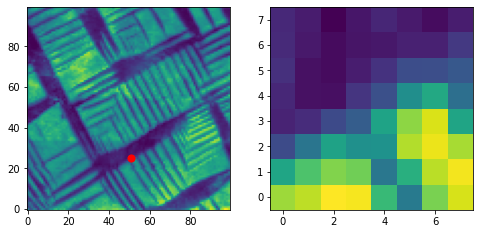

In [6]:
#normalize 
norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
patch_image = norm_(amplitude) #normalize amplitude

# extract subimage for each point on a grid
coordinates = utils.get_coord_grid(patch_image, 1)   #grid

ws = 8  #patch window size
pix = int(len(patch_image)+1-ws)  #total pixel number

features_all, indices_all, _ = utils.extract_subimages(patch_image, coordinates, ws)
features_all = features_all[:,:,:,0]

# Show example patch and whole image
k = 2000  # index
_, (ax1, ax2) = plt.subplots(1,2, figsize = (8, 4))
ax1.imshow(patch_image, origin = 'lower')
ax1.scatter(indices_all[k, 1], indices_all[k, 0], c = 'r', s = 50)
ax2.imshow(features_all[k], origin = 'lower')

(-0.5, 99.5, -0.5, 99.5)

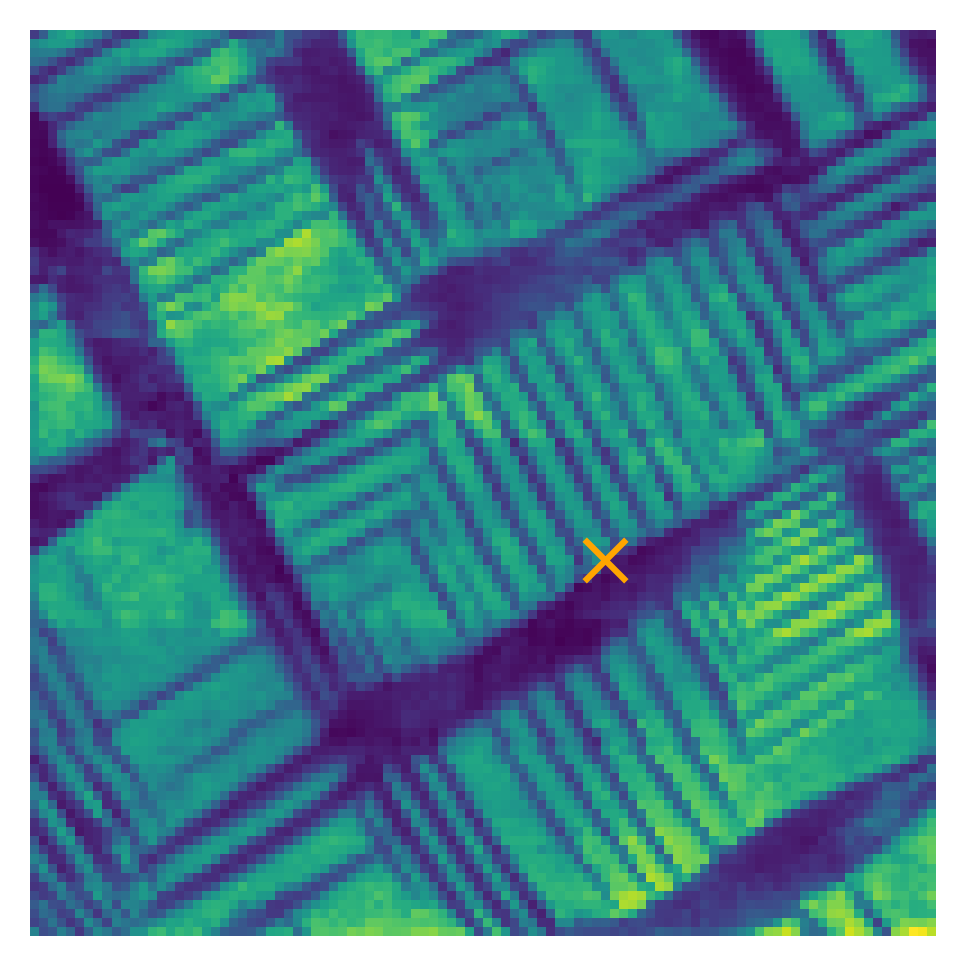

In [7]:
k1 = 3500; k2 = 5500  # index
_, ax1 = plt.subplots(figsize = (4, 4), dpi = 300)
ax1.imshow(patch_image, origin = 'lower')
ax1.scatter(indices_all[k1, 1], indices_all[k1, 0], c = 'orange', marker = "x", s = 100)
#ax1.scatter(indices_all[k2, 1], indices_all[k2, 0], c = 'orange', s = 50)
ax1.axis('off')

(-0.5, 7.5, -0.5, 7.5)

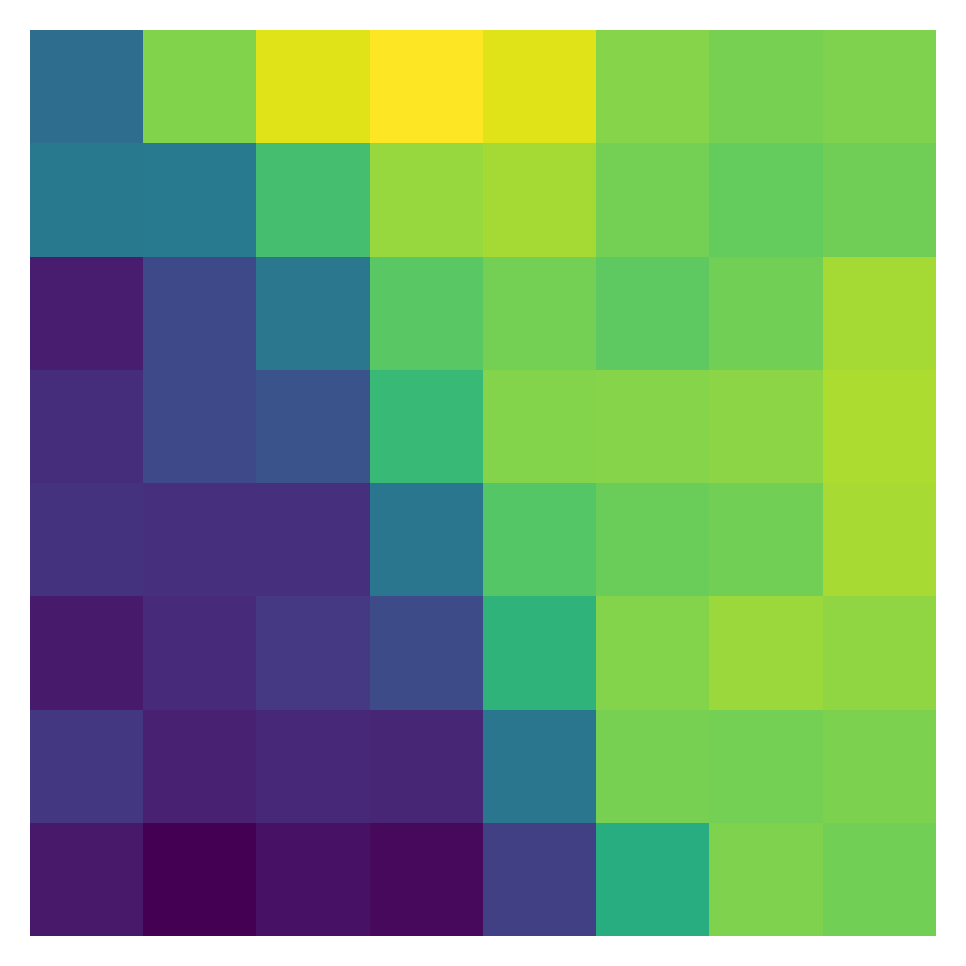

In [8]:
_, ax1 = plt.subplots(figsize = (4, 4), dpi = 300)
ax1.imshow(features_all[k2], origin = 'lower')
ax1.axis('off')


Text(0, 0.5, 'Piezoresponse (a.u.)')

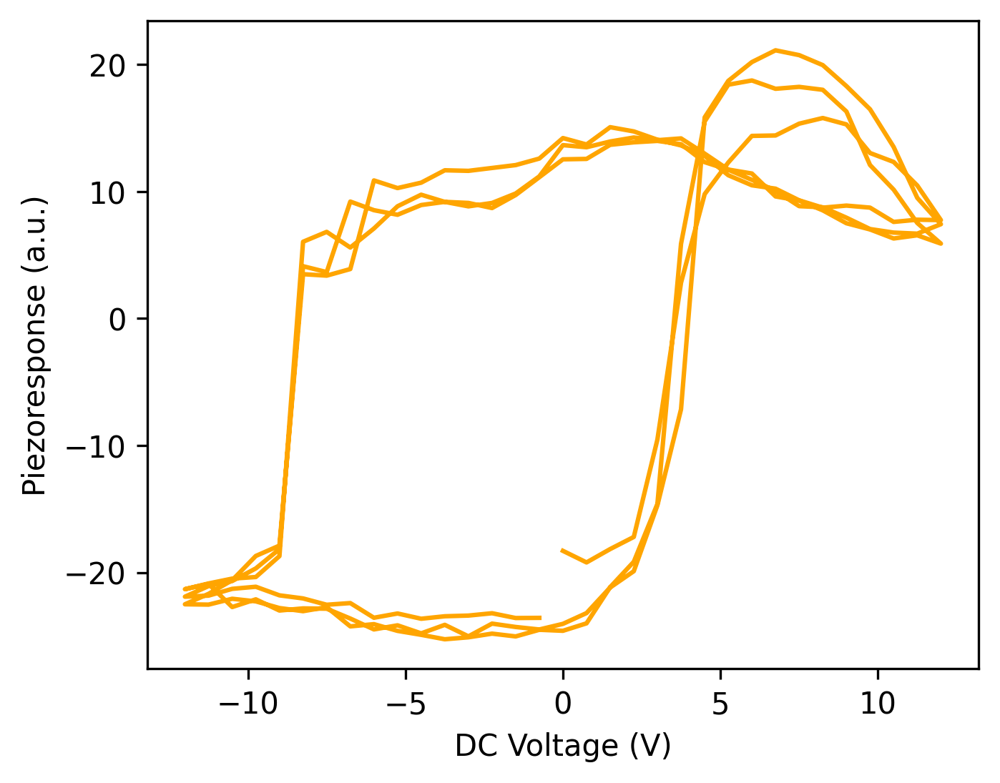

In [9]:
_,  ax2 = plt.subplots(figsize = (5, 4), dpi = 300)
ax2.plot(DC, spec[int(indices_all[k1, 0]), int(indices_all[k1, 1]),], c = 'orange')
#ax2.plot(DC, spec[int(indices_all[k2, 0]), int(indices_all[k2, 1]),], c = 'orange')
ax2.set_xlabel('DC Voltage (V)')
ax2.set_ylabel("Piezoresponse (a.u.)")

In [10]:
# Extract target scalarizers corresponding to patches
coercive_field = np.zeros(pix*pix)
loop_width = np.zeros(pix*pix)
loop_area_on = np.zeros(pix*pix)
loop_area_off = np.zeros(pix*pix)

for i in range (pix*pix):
    coercive_field [i] = Cf[int(indices_all[i,0]), int(indices_all[i,1])]   #coercive field
    loop_width [i] = width[int(indices_all[i,0]), int(indices_all[i,1])]    #loop width
    loop_area_on [i] = A_on[int(indices_all[i,0]), int(indices_all[i,1])]    #on field loop area
    loop_area_off [i] = A_off[int(indices_all[i,0]), int(indices_all[i,1])]  #off field loop area

Prepare train dataset

In [11]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)  #training input: image patches

y_targ = loop_area_off     #training output: off field loop area 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())

y = y_targ.reshape(-1)
X.shape, y.shape

((8649, 64), (8649,))

Train on full data

In [35]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=200) 

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)


Epoch 1/200 ... Training loss: 0.7748
Epoch 10/200 ... Training loss: 0.7293
Epoch 20/200 ... Training loss: 0.693
Epoch 30/200 ... Training loss: 0.6559
Epoch 40/200 ... Training loss: 0.6183
Epoch 50/200 ... Training loss: 0.5797
Epoch 60/200 ... Training loss: 0.5407
Epoch 70/200 ... Training loss: 0.5004
Epoch 80/200 ... Training loss: 0.4596
Epoch 90/200 ... Training loss: 0.4175
Epoch 100/200 ... Training loss: 0.3757
Epoch 110/200 ... Training loss: 0.3327
Epoch 120/200 ... Training loss: 0.287
Epoch 130/200 ... Training loss: 0.2435
Epoch 140/200 ... Training loss: 0.1973
Epoch 150/200 ... Training loss: 0.1538
Epoch 160/200 ... Training loss: 0.1068
Epoch 170/200 ... Training loss: 0.0616
Epoch 180/200 ... Training loss: 0.0152
Epoch 190/200 ... Training loss: -0.0288
Epoch 200/200 ... Training loss: -0.0738


In [ ]:
#@title Function for plotting DKL prediction and uncertainty
def plot_dkl_result (ground_truth, dkl_mean, 
                     dkl_var, indices=None, ws=None, 
                     scatter_location = False):
  '''
  Function plots DKL prediction and uncertainty.
  Setting scatter_location = True and providing indices_train
  and window_size enable plotting training data points in ground
  truth.
  '''
  
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (12, 4))

  cm = 'viridis'
  shrink = 0.7
  pix = int(math.sqrt(len(dkl_mean)))

  im1 = ax1.imshow(ground_truth.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im1, ax=ax1, shrink = shrink)
  if scatter_location == True:
    ax1.scatter(indices[:, 1]-int(ws/2), indices[:, 0]-int(ws/2), s=12,
                c = np.arange(len(indices)), cmap = 'bwr')
  ax1.set_title("Ground Truth")
  ax1.axis('off')
  
  im2 = ax2.imshow(dkl_mean.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im2, ax=ax2, shrink = shrink)
  ax2.set_title("DKL Prediction")
  ax2.axis('off')
  
  im3 = ax3.imshow(dkl_var.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im3, ax=ax3, shrink = shrink)
  ax3.set_title("DKL Uncertainty")
  ax3.axis('off')

  plt.show()
  plt.close(fig)

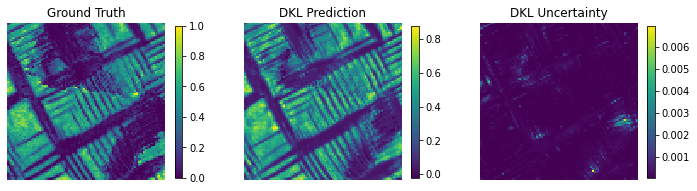

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))
plot_dkl_result(y, mean, var)

(-0.5, 92.5, -0.5, 92.5)

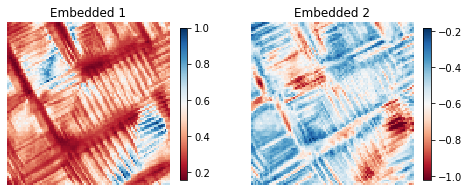

In [ ]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# cm = 'RdBu'
# shrink = 0.7

# im1 = ax1.imshow(embeded[:,0].reshape(pix, pix), interpolation='nearest', origin = "lower", cmap=cm)
# fig.colorbar(im1, ax=ax1, shrink = shrink)
# ax1.set_title("Embedded 1")
# ax1.axis('off')

# im2 = ax2.imshow(embeded[:,1].reshape(pix, pix), interpolation='nearest', origin = "lower", cmap=cm)
# fig.colorbar(im2, ax=ax2, shrink = shrink)
# ax2.set_title("Embedded 2")
# ax2.axis('off')

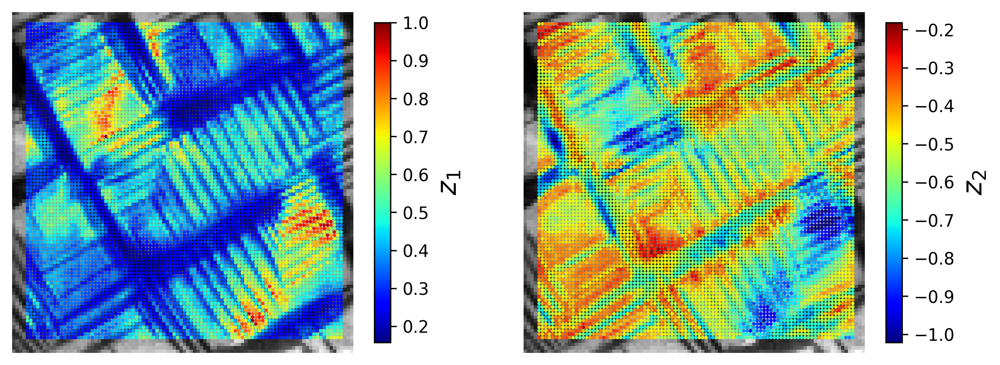

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), dpi = 300)
ax1.imshow(patch_image, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,0].reshape(pix, pix), cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(patch_image, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,1].reshape(pix, pix), cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)


# DKL BO experiment

In [ ]:
#@title Define acquisition functions for BO:
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

def qUCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()

In [ ]:
#@title Functions for plotting result, selecting next measurement point, and update train/test dataset
def sel_next_point (dklgp, X_train, X_test, xi):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  global acq_idx
  if acq_idx == 0:  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq_idx == 1:  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq_idx == 2:  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

def update_train_test_data(X_train, X_test, y_train, y_test, 
                           indices_train, indices_test, 
                           next_point_idx, measured_point, next_point):
  X_train = np.append(X_train, X_test[next_point_idx][None], 0)
  X_test = np.delete(X_test, next_point_idx, 0)
  y_train = np.append(y_train, measured_point)
  y_test = np.delete(y_test, next_point_idx) 
  indices_train = np.append(indices_train, next_point[None], 0)
  indices_test = np.delete(indices_test, next_point_idx, 0)

  return (X_train, X_test, y_train, y_test, indices_train, indices_test)

Initialize train, test dataset

Initialize DKL parameters

In [ ]:
exploration_steps = 200

xi = 0.01  # balances exploration and explitation for EI and qEI
cm = 'viridis'
shrink = 0.7

# *Please select different acquistion function and run multiple time step 1-4*

In [20]:
# determine acquition funciton, 
acq = 3  # 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

rf = '/content/rf/'   #root folder
if not os.path.exists(rf):
    os.mkdir(rf)

acq_funcs = ['EI', 'MU', 'UCB']   #list corresponds to Func sel_next_point.
# root_folderEI = rf+"EI/"   
# root_folderMU = rf+"MU/"
# root_folderUCB = rf+"UCB/"
 
if acq == 3:             # when acq = 3, run all acq_funcs
  if not os.path.exists(rf + acq_funcs[0]):
    os.mkdir(rf + acq_funcs[0])
  if not os.path.exists(rf + acq_funcs[1]):
    os.mkdir(rf + acq_funcs[1])
  if not os.path.exists(rf + acq_funcs[2]):
    os.mkdir(rf + acq_funcs[2])
elif acq < 3:
  if not os.path.exists(rf + acq_funcs[acq]):  # change root folder name when you change acquistion funciton
    os.mkdir(rf + acq_funcs[acq])

## Step 1. DKL exploration based on target property of hysteresis loop area



*   This exploration process uses either EI acquition function or maximum uncertainty location
*   During the exploration, DKL will determine 200 measurement locations. Then, these locations will be used in later analysis processes with different target properties. 



In [ ]:
ts = 0.9995  #test data size
rs = 5   #random state determines initial train data

In [ ]:
#@title define a function to run DKL exploration
def dkl_explore (save_explore):
  global X, y, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Here X_train and y_train are our measured image patches and spectra information,
  # whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
  # whereas the indices_test are the grid coordinates of the remaining available points on the grid
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(rf + acq_funcs[acq_idx] + save_explore):
    os.mkdir(rf + acq_funcs[acq_idx] + save_explore)
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train, 
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train, 
                    ws = ws, scatter_location = True)
    
    # Compute acquisition function
    next_point_idx = sel_next_point (dklgp, X_train, X_test, xi)
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train, 
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test, 
           indices_train = indices_train, indices_test = indices_test)

X_train shape: 
(4, 64)
1/3
Epoch 1/200 ... Training loss: 0.9799


/usr/local/lib/python3.8/dist-packages/gpytorch/lazy/triangular_lazy_tensor.py:124: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:2115.)
  res = torch.triangular_solve(right_tensor, self.evaluate(), upper=self.upper).solution


Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 ... Training loss: 0.7793
Epoch 50/200 ... Training loss: 0.736
Epoch 60/200 ... Training loss: 0.6927
Epoch 70/200 ... Training loss: 0.6494
Epoch 80/200 ... Training loss: 0.6061
Epoch 90/200 ... Training loss: 0.5632
Epoch 100/200 ... Training loss: 0.5206
Epoch 110/200 ... Training loss: 0.4786
Epoch 120/200 ... Training loss: 0.4373
Epoch 130/200 ... Training loss: 0.397
Epoch 140/200 ... Training loss: 0.3578
Epoch 150/200 ... Training loss: 0.3198
Epoch 160/200 ... Training loss: 0.2831
Epoch 170/200 ... Training loss: 0.2463
Epoch 180/200 ... Training loss: 0.1955
Epoch 190/200 ... Training loss: 0.1559
Epoch 200/200 ... Training loss: 0.1217


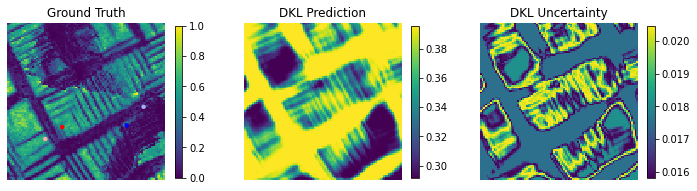

2/3
Epoch 1/200 ... Training loss: 0.9712
Epoch 10/200 ... Training loss: 0.9193
Epoch 20/200 ... Training loss: 0.8741
Epoch 30/200 ... Training loss: 0.8287
Epoch 40/200 ... Training loss: 0.7803
Epoch 50/200 ... Training loss: 0.7315
Epoch 60/200 ... Training loss: 0.6899
Epoch 70/200 ... Training loss: 0.6478
Epoch 80/200 ... Training loss: 0.6063
Epoch 90/200 ... Training loss: 0.5647
Epoch 100/200 ... Training loss: 0.523
Epoch 110/200 ... Training loss: 0.481
Epoch 120/200 ... Training loss: 0.4389
Epoch 130/200 ... Training loss: 0.3938
Epoch 140/200 ... Training loss: 0.3458
Epoch 150/200 ... Training loss: 0.3032
Epoch 160/200 ... Training loss: 0.2616
Epoch 170/200 ... Training loss: 0.2214
Epoch 180/200 ... Training loss: 0.1833
Epoch 190/200 ... Training loss: 0.148
Epoch 200/200 ... Training loss: 0.1154


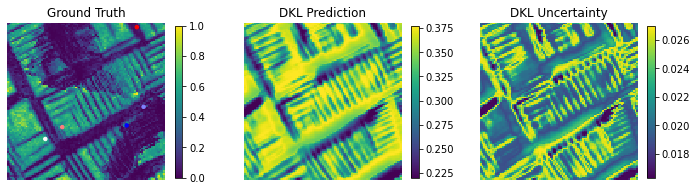

3/3
Epoch 1/200 ... Training loss: 0.954
Epoch 10/200 ... Training loss: 0.8985
Epoch 20/200 ... Training loss: 0.8524
Epoch 30/200 ... Training loss: 0.8082
Epoch 40/200 ... Training loss: 0.7647
Epoch 50/200 ... Training loss: 0.7206
Epoch 60/200 ... Training loss: 0.6768
Epoch 70/200 ... Training loss: 0.6325
Epoch 80/200 ... Training loss: 0.5882
Epoch 90/200 ... Training loss: 0.5447
Epoch 100/200 ... Training loss: 0.5025
Epoch 110/200 ... Training loss: 0.4606
Epoch 120/200 ... Training loss: 0.4191
Epoch 130/200 ... Training loss: 0.3777
Epoch 140/200 ... Training loss: 0.3359
Epoch 150/200 ... Training loss: 0.2928
Epoch 160/200 ... Training loss: 0.2487
Epoch 170/200 ... Training loss: 0.2042
Epoch 180/200 ... Training loss: 0.1597
Epoch 190/200 ... Training loss: 0.1207
Epoch 200/200 ... Training loss: 0.0838


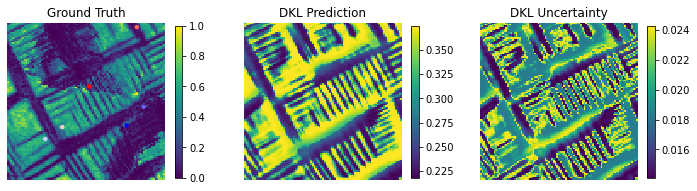

X_train shape: 
(4, 64)
1/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 ... Training loss: 0.7793
Epoch 50/200 ... Training loss: 0.736
Epoch 60/200 ... Training loss: 0.6927
Epoch 70/200 ... Training loss: 0.6494
Epoch 80/200 ... Training loss: 0.6061
Epoch 90/200 ... Training loss: 0.5632
Epoch 100/200 ... Training loss: 0.5206
Epoch 110/200 ... Training loss: 0.4786
Epoch 120/200 ... Training loss: 0.4373
Epoch 130/200 ... Training loss: 0.397
Epoch 140/200 ... Training loss: 0.3578
Epoch 150/200 ... Training loss: 0.3198
Epoch 160/200 ... Training loss: 0.2831
Epoch 170/200 ... Training loss: 0.2463
Epoch 180/200 ... Training loss: 0.1955
Epoch 190/200 ... Training loss: 0.1559
Epoch 200/200 ... Training loss: 0.1217


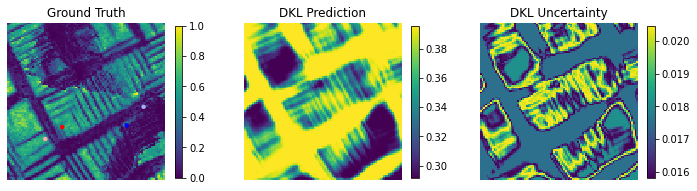

2/3
Epoch 1/200 ... Training loss: 0.9729
Epoch 10/200 ... Training loss: 0.8955
Epoch 20/200 ... Training loss: 0.8476
Epoch 30/200 ... Training loss: 0.8015
Epoch 40/200 ... Training loss: 0.7579
Epoch 50/200 ... Training loss: 0.7151
Epoch 60/200 ... Training loss: 0.6719
Epoch 70/200 ... Training loss: 0.6284
Epoch 80/200 ... Training loss: 0.5848
Epoch 90/200 ... Training loss: 0.5412
Epoch 100/200 ... Training loss: 0.4978
Epoch 110/200 ... Training loss: 0.4547
Epoch 120/200 ... Training loss: 0.412
Epoch 130/200 ... Training loss: 0.3699
Epoch 140/200 ... Training loss: 0.3287
Epoch 150/200 ... Training loss: 0.2885
Epoch 160/200 ... Training loss: 0.2494
Epoch 170/200 ... Training loss: 0.2116
Epoch 180/200 ... Training loss: 0.1753
Epoch 190/200 ... Training loss: 0.1407
Epoch 200/200 ... Training loss: 0.1077


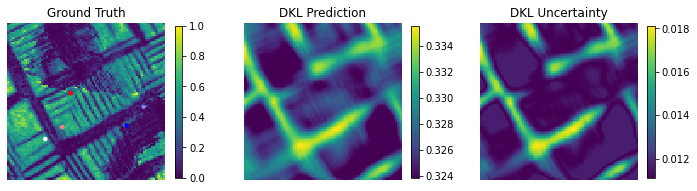

3/3
Epoch 1/200 ... Training loss: 0.9568
Epoch 10/200 ... Training loss: 0.9017
Epoch 20/200 ... Training loss: 0.856
Epoch 30/200 ... Training loss: 0.8165
Epoch 40/200 ... Training loss: 0.7726
Epoch 50/200 ... Training loss: 0.7264
Epoch 60/200 ... Training loss: 0.6822
Epoch 70/200 ... Training loss: 0.6391
Epoch 80/200 ... Training loss: 0.5953
Epoch 90/200 ... Training loss: 0.5503
Epoch 100/200 ... Training loss: 0.5053
Epoch 110/200 ... Training loss: 0.4599
Epoch 120/200 ... Training loss: 0.4181
Epoch 130/200 ... Training loss: 0.3773
Epoch 140/200 ... Training loss: 0.3359
Epoch 150/200 ... Training loss: 0.2943
Epoch 160/200 ... Training loss: 0.2526
Epoch 170/200 ... Training loss: 0.2111
Epoch 180/200 ... Training loss: 0.17
Epoch 190/200 ... Training loss: 0.1315
Epoch 200/200 ... Training loss: 0.0955


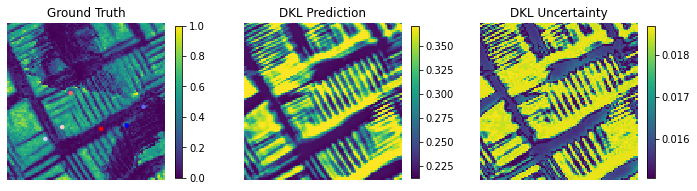

X_train shape: 
(4, 64)
1/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 ... Training loss: 0.7793
Epoch 50/200 ... Training loss: 0.736
Epoch 60/200 ... Training loss: 0.6927
Epoch 70/200 ... Training loss: 0.6494
Epoch 80/200 ... Training loss: 0.6061
Epoch 90/200 ... Training loss: 0.5632
Epoch 100/200 ... Training loss: 0.5206
Epoch 110/200 ... Training loss: 0.4786
Epoch 120/200 ... Training loss: 0.4373
Epoch 130/200 ... Training loss: 0.397
Epoch 140/200 ... Training loss: 0.3578
Epoch 150/200 ... Training loss: 0.3198
Epoch 160/200 ... Training loss: 0.2831
Epoch 170/200 ... Training loss: 0.2463
Epoch 180/200 ... Training loss: 0.1955
Epoch 190/200 ... Training loss: 0.1559
Epoch 200/200 ... Training loss: 0.1217


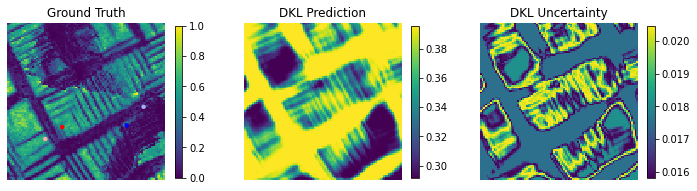

2/3
Epoch 1/200 ... Training loss: 0.9528
Epoch 10/200 ... Training loss: 0.9234
Epoch 20/200 ... Training loss: 0.8697
Epoch 30/200 ... Training loss: 0.8236
Epoch 40/200 ... Training loss: 0.7791
Epoch 50/200 ... Training loss: 0.7343
Epoch 60/200 ... Training loss: 0.6893
Epoch 70/200 ... Training loss: 0.644
Epoch 80/200 ... Training loss: 0.6014
Epoch 90/200 ... Training loss: 0.5571
Epoch 100/200 ... Training loss: 0.5148
Epoch 110/200 ... Training loss: 0.4733
Epoch 120/200 ... Training loss: 0.4323
Epoch 130/200 ... Training loss: 0.3917
Epoch 140/200 ... Training loss: 0.3514
Epoch 150/200 ... Training loss: 0.3092
Epoch 160/200 ... Training loss: 0.2645
Epoch 170/200 ... Training loss: 0.2208
Epoch 180/200 ... Training loss: 0.1799
Epoch 190/200 ... Training loss: 0.139
Epoch 200/200 ... Training loss: 0.1013


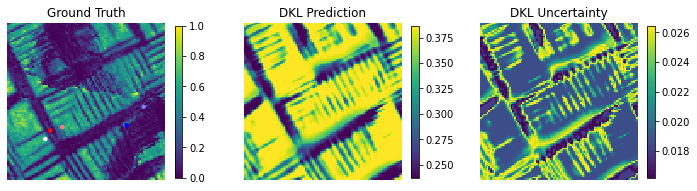

3/3
Epoch 1/200 ... Training loss: 0.9338
Epoch 10/200 ... Training loss: 0.9024
Epoch 20/200 ... Training loss: 0.8537
Epoch 30/200 ... Training loss: 0.8078
Epoch 40/200 ... Training loss: 0.7614
Epoch 50/200 ... Training loss: 0.7164
Epoch 60/200 ... Training loss: 0.672
Epoch 70/200 ... Training loss: 0.6275
Epoch 80/200 ... Training loss: 0.5816
Epoch 90/200 ... Training loss: 0.5367
Epoch 100/200 ... Training loss: 0.4943
Epoch 110/200 ... Training loss: 0.4519
Epoch 120/200 ... Training loss: 0.4092
Epoch 130/200 ... Training loss: 0.3672
Epoch 140/200 ... Training loss: 0.3256
Epoch 150/200 ... Training loss: 0.2849
Epoch 160/200 ... Training loss: 0.2422
Epoch 170/200 ... Training loss: 0.1983
Epoch 180/200 ... Training loss: 0.1546
Epoch 190/200 ... Training loss: 0.1149
Epoch 200/200 ... Training loss: 0.0766


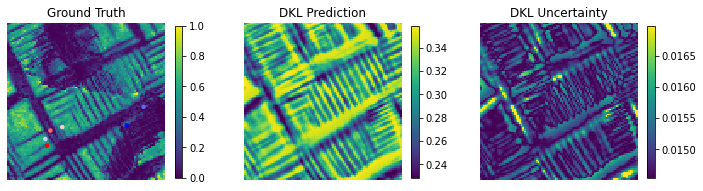

In [ ]:
save_explore =  "/explore_dkl_record/"

# run DKL exploration with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_explore(save_explore)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_explore(save_explore)

## Now, DKL experiment based on hysteresis loop area is done. Next, the exploration locations will be used for other analyses with different target properties, e.g., hysteresis loop width, coercive field, etc. We will check the evolution of DKL results of other target properties. 


## Step 2-1 

First, DKL analysis of hysteresis loop width. Note that here the y_train is hysteresis loop width, and the training data points are from the DKL exploration in Step 1.

In [ ]:
#@title define a function to run dkl counterfactual with different scalarizer
def dkl_counterfactual(y, save_counter):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  
  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_counter):
    os.mkdir(rf + acq_funcs[acq_idx] + save_counter)
  
  # Save initial train data 
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  
  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, lr = 0.01)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train, 
                    ws = ws, scatter_location = True)
    
    # Load measurement locations from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_counter)
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)


1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


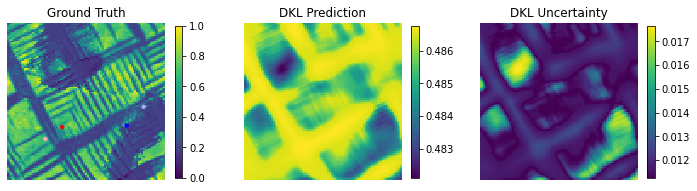

2/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9248
Epoch 20/200 ... Training loss: 0.8665
Epoch 30/200 ... Training loss: 0.813
Epoch 40/200 ... Training loss: 0.7611
Epoch 50/200 ... Training loss: 0.7112
Epoch 60/200 ... Training loss: 0.6662
Epoch 70/200 ... Training loss: 0.622
Epoch 80/200 ... Training loss: 0.5782
Epoch 90/200 ... Training loss: 0.5334
Epoch 100/200 ... Training loss: 0.4888
Epoch 110/200 ... Training loss: 0.4442
Epoch 120/200 ... Training loss: 0.4003
Epoch 130/200 ... Training loss: 0.357
Epoch 140/200 ... Training loss: 0.3143
Epoch 150/200 ... Training loss: 0.2724
Epoch 160/200 ... Training loss: 0.2313
Epoch 170/200 ... Training loss: 0.1907
Epoch 180/200 ... Training loss: 0.1506
Epoch 190/200 ... Training loss: 0.1104
Epoch 200/200 ... Training loss: 0.0663


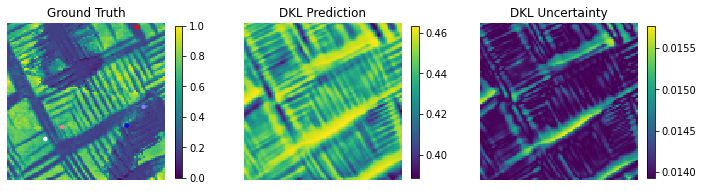

3/3
Epoch 1/200 ... Training loss: 0.9589
Epoch 10/200 ... Training loss: 0.9011
Epoch 20/200 ... Training loss: 0.8471
Epoch 30/200 ... Training loss: 0.79
Epoch 40/200 ... Training loss: 0.7414
Epoch 50/200 ... Training loss: 0.6959
Epoch 60/200 ... Training loss: 0.652
Epoch 70/200 ... Training loss: 0.6074
Epoch 80/200 ... Training loss: 0.5649
Epoch 90/200 ... Training loss: 0.5192
Epoch 100/200 ... Training loss: 0.4731
Epoch 110/200 ... Training loss: 0.4282
Epoch 120/200 ... Training loss: 0.3835
Epoch 130/200 ... Training loss: 0.339
Epoch 140/200 ... Training loss: 0.2951
Epoch 150/200 ... Training loss: 0.2515
Epoch 160/200 ... Training loss: 0.2083
Epoch 170/200 ... Training loss: 0.1656
Epoch 180/200 ... Training loss: 0.1232
Epoch 190/200 ... Training loss: 0.0809
Epoch 200/200 ... Training loss: 0.0387


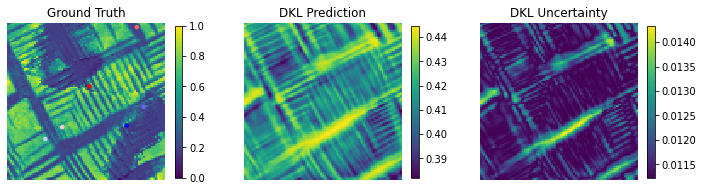

1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


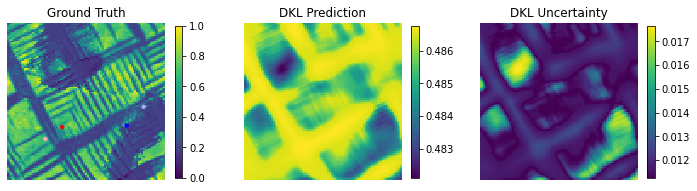

2/3
Epoch 1/200 ... Training loss: 0.9809
Epoch 10/200 ... Training loss: 0.8979
Epoch 20/200 ... Training loss: 0.8454
Epoch 30/200 ... Training loss: 0.7942
Epoch 40/200 ... Training loss: 0.7441
Epoch 50/200 ... Training loss: 0.6961
Epoch 60/200 ... Training loss: 0.6495
Epoch 70/200 ... Training loss: 0.6033
Epoch 80/200 ... Training loss: 0.5567
Epoch 90/200 ... Training loss: 0.5099
Epoch 100/200 ... Training loss: 0.4629
Epoch 110/200 ... Training loss: 0.4161
Epoch 120/200 ... Training loss: 0.3693
Epoch 130/200 ... Training loss: 0.3228
Epoch 140/200 ... Training loss: 0.2767
Epoch 150/200 ... Training loss: 0.2312
Epoch 160/200 ... Training loss: 0.1863
Epoch 170/200 ... Training loss: 0.1424
Epoch 180/200 ... Training loss: 0.0995
Epoch 190/200 ... Training loss: 0.0578
Epoch 200/200 ... Training loss: 0.0174


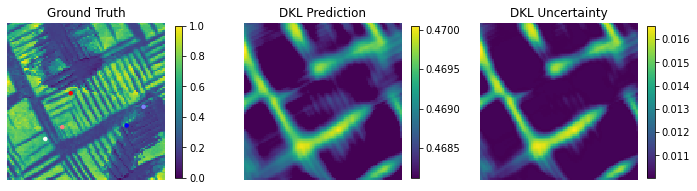

3/3
Epoch 1/200 ... Training loss: 0.9615
Epoch 10/200 ... Training loss: 0.9102
Epoch 20/200 ... Training loss: 0.8541
Epoch 30/200 ... Training loss: 0.8026
Epoch 40/200 ... Training loss: 0.7558
Epoch 50/200 ... Training loss: 0.7103
Epoch 60/200 ... Training loss: 0.6647
Epoch 70/200 ... Training loss: 0.6182
Epoch 80/200 ... Training loss: 0.5716
Epoch 90/200 ... Training loss: 0.5225
Epoch 100/200 ... Training loss: 0.4774
Epoch 110/200 ... Training loss: 0.4296
Epoch 120/200 ... Training loss: 0.3811
Epoch 130/200 ... Training loss: 0.3338
Epoch 140/200 ... Training loss: 0.2883
Epoch 150/200 ... Training loss: 0.2424
Epoch 160/200 ... Training loss: 0.1972
Epoch 170/200 ... Training loss: 0.1522
Epoch 180/200 ... Training loss: 0.1071
Epoch 190/200 ... Training loss: 0.0637
Epoch 200/200 ... Training loss: 0.0215


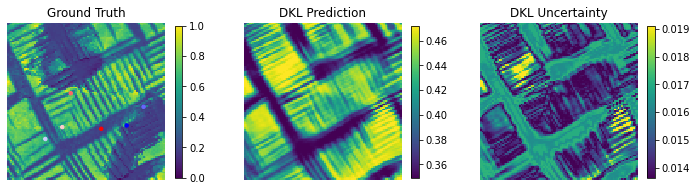

1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


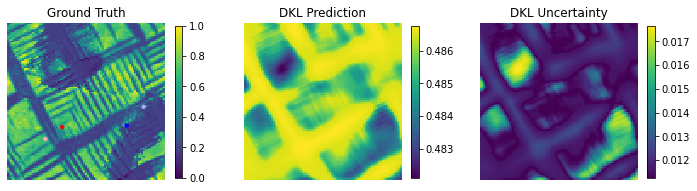

2/3
Epoch 1/200 ... Training loss: 0.9583
Epoch 10/200 ... Training loss: 0.9244
Epoch 20/200 ... Training loss: 0.8658
Epoch 30/200 ... Training loss: 0.8143
Epoch 40/200 ... Training loss: 0.7661
Epoch 50/200 ... Training loss: 0.7179
Epoch 60/200 ... Training loss: 0.6695
Epoch 70/200 ... Training loss: 0.621
Epoch 80/200 ... Training loss: 0.574
Epoch 90/200 ... Training loss: 0.5276
Epoch 100/200 ... Training loss: 0.4813
Epoch 110/200 ... Training loss: 0.4353
Epoch 120/200 ... Training loss: 0.3897
Epoch 130/200 ... Training loss: 0.3446
Epoch 140/200 ... Training loss: 0.3002
Epoch 150/200 ... Training loss: 0.2567
Epoch 160/200 ... Training loss: 0.2141
Epoch 170/200 ... Training loss: 0.1729
Epoch 180/200 ... Training loss: 0.1332
Epoch 190/200 ... Training loss: 0.0949
Epoch 200/200 ... Training loss: 0.0582


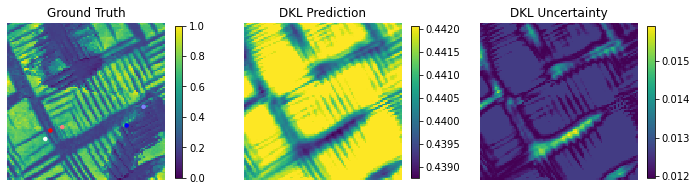

3/3
Epoch 1/200 ... Training loss: 0.9389
Epoch 10/200 ... Training loss: 0.9033
Epoch 20/200 ... Training loss: 0.8489
Epoch 30/200 ... Training loss: 0.7972
Epoch 40/200 ... Training loss: 0.7473
Epoch 50/200 ... Training loss: 0.6989
Epoch 60/200 ... Training loss: 0.6517
Epoch 70/200 ... Training loss: 0.6039
Epoch 80/200 ... Training loss: 0.5559
Epoch 90/200 ... Training loss: 0.5095
Epoch 100/200 ... Training loss: 0.4644
Epoch 110/200 ... Training loss: 0.4189
Epoch 120/200 ... Training loss: 0.3726
Epoch 130/200 ... Training loss: 0.3272
Epoch 140/200 ... Training loss: 0.2824
Epoch 150/200 ... Training loss: 0.2377
Epoch 160/200 ... Training loss: 0.1939
Epoch 170/200 ... Training loss: 0.151
Epoch 180/200 ... Training loss: 0.1091
Epoch 190/200 ... Training loss: 0.0684
Epoch 200/200 ... Training loss: 0.0291


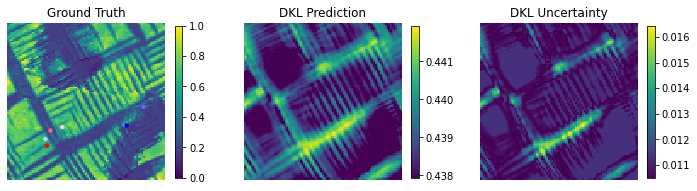

In [ ]:
# Set hysteresis loop width as target property
y_targ = loop_width     #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter1 = "/counter_loopwidth_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter1)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter1)

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


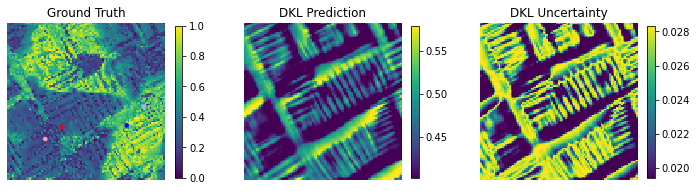

2/3
Epoch 1/200 ... Training loss: 1.006
Epoch 10/200 ... Training loss: 0.9513
Epoch 20/200 ... Training loss: 0.8988
Epoch 30/200 ... Training loss: 0.8386
Epoch 40/200 ... Training loss: 0.7908
Epoch 50/200 ... Training loss: 0.7447
Epoch 60/200 ... Training loss: 0.7015
Epoch 70/200 ... Training loss: 0.6597
Epoch 80/200 ... Training loss: 0.6178
Epoch 90/200 ... Training loss: 0.565
Epoch 100/200 ... Training loss: 0.518
Epoch 110/200 ... Training loss: 0.4732
Epoch 120/200 ... Training loss: 0.4298
Epoch 130/200 ... Training loss: 0.3883
Epoch 140/200 ... Training loss: 0.3487
Epoch 150/200 ... Training loss: 0.3111
Epoch 160/200 ... Training loss: 0.2757
Epoch 170/200 ... Training loss: 0.2425
Epoch 180/200 ... Training loss: 0.2117
Epoch 190/200 ... Training loss: 0.1833
Epoch 200/200 ... Training loss: 0.1574


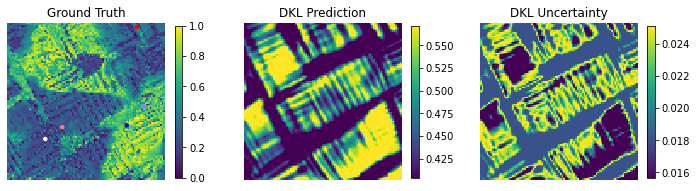

3/3
Epoch 1/200 ... Training loss: 1.0153
Epoch 10/200 ... Training loss: 0.9544
Epoch 20/200 ... Training loss: 0.8832
Epoch 30/200 ... Training loss: 0.8299
Epoch 40/200 ... Training loss: 0.7866
Epoch 50/200 ... Training loss: 0.7381
Epoch 60/200 ... Training loss: 0.6903
Epoch 70/200 ... Training loss: 0.6471
Epoch 80/200 ... Training loss: 0.6047
Epoch 90/200 ... Training loss: 0.5627
Epoch 100/200 ... Training loss: 0.5207
Epoch 110/200 ... Training loss: 0.4782
Epoch 120/200 ... Training loss: 0.4345
Epoch 130/200 ... Training loss: 0.3882
Epoch 140/200 ... Training loss: 0.3402
Epoch 150/200 ... Training loss: 0.3013
Epoch 160/200 ... Training loss: 0.264
Epoch 170/200 ... Training loss: 0.2289
Epoch 180/200 ... Training loss: 0.196
Epoch 190/200 ... Training loss: 0.1654
Epoch 200/200 ... Training loss: 0.137


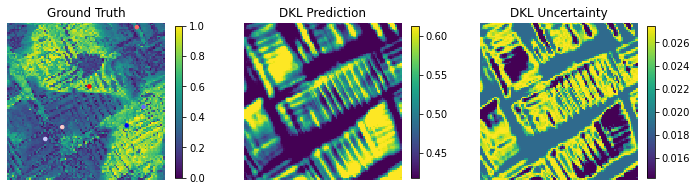

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


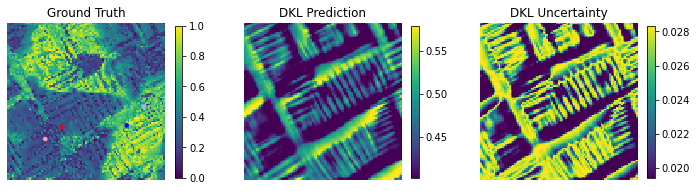

2/3
Epoch 1/200 ... Training loss: 1.0112
Epoch 10/200 ... Training loss: 0.9316
Epoch 20/200 ... Training loss: 0.8836
Epoch 30/200 ... Training loss: 0.8343
Epoch 40/200 ... Training loss: 0.7876
Epoch 50/200 ... Training loss: 0.7433
Epoch 60/200 ... Training loss: 0.701
Epoch 70/200 ... Training loss: 0.6596
Epoch 80/200 ... Training loss: 0.6185
Epoch 90/200 ... Training loss: 0.578
Epoch 100/200 ... Training loss: 0.5381
Epoch 110/200 ... Training loss: 0.4986
Epoch 120/200 ... Training loss: 0.4476
Epoch 130/200 ... Training loss: 0.4001
Epoch 140/200 ... Training loss: 0.3579
Epoch 150/200 ... Training loss: 0.3198
Epoch 160/200 ... Training loss: 0.2838
Epoch 170/200 ... Training loss: 0.2501
Epoch 180/200 ... Training loss: 0.2187
Epoch 190/200 ... Training loss: 0.1899
Epoch 200/200 ... Training loss: 0.1636


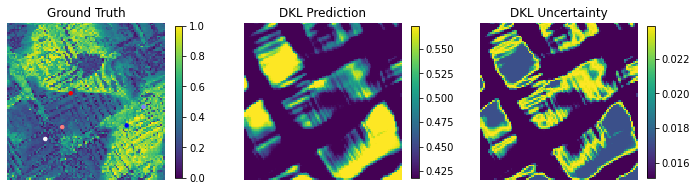

3/3
Epoch 1/200 ... Training loss: 0.9854
Epoch 10/200 ... Training loss: 0.9404
Epoch 20/200 ... Training loss: 0.8841
Epoch 30/200 ... Training loss: 0.8326
Epoch 40/200 ... Training loss: 0.7836
Epoch 50/200 ... Training loss: 0.7372
Epoch 60/200 ... Training loss: 0.6929
Epoch 70/200 ... Training loss: 0.6498
Epoch 80/200 ... Training loss: 0.6075
Epoch 90/200 ... Training loss: 0.5644
Epoch 100/200 ... Training loss: 0.5224
Epoch 110/200 ... Training loss: 0.4811
Epoch 120/200 ... Training loss: 0.4409
Epoch 130/200 ... Training loss: 0.4016
Epoch 140/200 ... Training loss: 0.3639
Epoch 150/200 ... Training loss: 0.3278
Epoch 160/200 ... Training loss: 0.2923
Epoch 170/200 ... Training loss: 0.2493
Epoch 180/200 ... Training loss: 0.2139
Epoch 190/200 ... Training loss: 0.1795
Epoch 200/200 ... Training loss: 0.1462


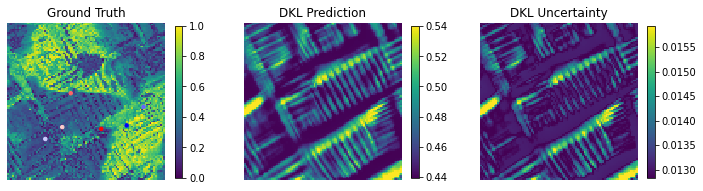

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


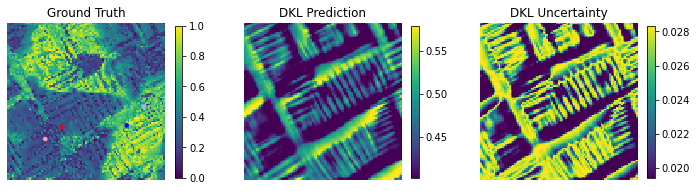

2/3
Epoch 1/200 ... Training loss: 0.9874
Epoch 10/200 ... Training loss: 0.9772
Epoch 20/200 ... Training loss: 0.9136
Epoch 30/200 ... Training loss: 0.855
Epoch 40/200 ... Training loss: 0.8045
Epoch 50/200 ... Training loss: 0.7561
Epoch 60/200 ... Training loss: 0.7087
Epoch 70/200 ... Training loss: 0.6641
Epoch 80/200 ... Training loss: 0.6209
Epoch 90/200 ... Training loss: 0.5793
Epoch 100/200 ... Training loss: 0.5399
Epoch 110/200 ... Training loss: 0.5018
Epoch 120/200 ... Training loss: 0.4647
Epoch 130/200 ... Training loss: 0.4289
Epoch 140/200 ... Training loss: 0.3944
Epoch 150/200 ... Training loss: 0.3608
Epoch 160/200 ... Training loss: 0.3271
Epoch 170/200 ... Training loss: 0.2909
Epoch 180/200 ... Training loss: 0.2482
Epoch 190/200 ... Training loss: 0.202
Epoch 200/200 ... Training loss: 0.1727


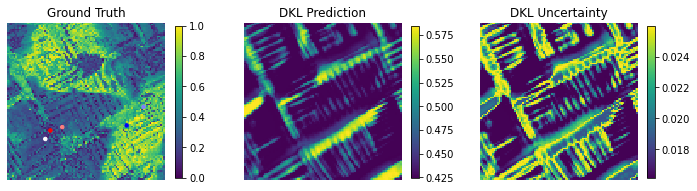

3/3
Epoch 1/200 ... Training loss: 0.9632
Epoch 10/200 ... Training loss: 0.9461
Epoch 20/200 ... Training loss: 0.8852
Epoch 30/200 ... Training loss: 0.8359
Epoch 40/200 ... Training loss: 0.7872
Epoch 50/200 ... Training loss: 0.7415
Epoch 60/200 ... Training loss: 0.6965
Epoch 70/200 ... Training loss: 0.6534
Epoch 80/200 ... Training loss: 0.6109
Epoch 90/200 ... Training loss: 0.5661
Epoch 100/200 ... Training loss: 0.5234
Epoch 110/200 ... Training loss: 0.4843
Epoch 120/200 ... Training loss: 0.4437
Epoch 130/200 ... Training loss: 0.3974
Epoch 140/200 ... Training loss: 0.3533
Epoch 150/200 ... Training loss: 0.3138
Epoch 160/200 ... Training loss: 0.272
Epoch 170/200 ... Training loss: 0.2319
Epoch 180/200 ... Training loss: 0.1964
Epoch 190/200 ... Training loss: 0.1633
Epoch 200/200 ... Training loss: 0.1327


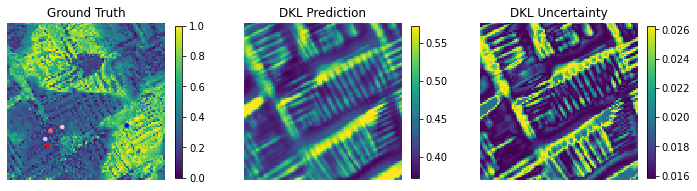

In [ ]:
# Set coercive field as target property
y_targ = coercive_field    #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter2 = "/counter_coercivefield_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter2)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter2)

## Step 3: DKL analysis based on random location. As a reference for the DKL analysis based on prior exploration locations from Step 1, next, we do DKL analyses based on random location with target properties, e.g. loop width, coercive field, on field hysteresis loop area.

Step 3-1: DKL analysis based on random location with target property of hysteresis loop width. Here the train data points are from random location.

In [ ]:
#@title define a function to run dkl analysis with random sampling
def dkl_random(y, save_random):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  
  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_random):
    os.mkdir(rf + acq_funcs[acq_idx] + save_random)
  
  # Save initial train data 
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, 
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  
  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, lr = 0.01)
    
    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train, 
                    ws = ws, scatter_location = True)
    
    # Load measurement locations from Step 1
    next_point_idx = np.random.randint(len(X_test))
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    
    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_random)
    np.savez("record{}.npz".format(e), 
             mean = mean, var = var, next_point_idx = next_point_idx, 
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


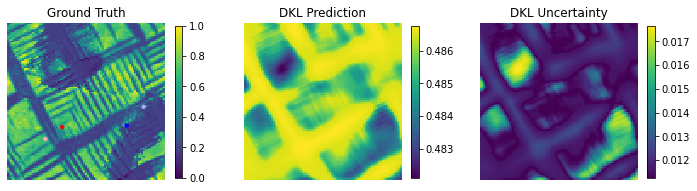

2/3
Epoch 1/200 ... Training loss: 0.9655
Epoch 10/200 ... Training loss: 0.9066
Epoch 20/200 ... Training loss: 0.8529
Epoch 30/200 ... Training loss: 0.7998
Epoch 40/200 ... Training loss: 0.7481
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.651
Epoch 70/200 ... Training loss: 0.6046
Epoch 80/200 ... Training loss: 0.5578
Epoch 90/200 ... Training loss: 0.511
Epoch 100/200 ... Training loss: 0.4638
Epoch 110/200 ... Training loss: 0.4171
Epoch 120/200 ... Training loss: 0.3707
Epoch 130/200 ... Training loss: 0.3245
Epoch 140/200 ... Training loss: 0.2788
Epoch 150/200 ... Training loss: 0.2338
Epoch 160/200 ... Training loss: 0.1896
Epoch 170/200 ... Training loss: 0.1463
Epoch 180/200 ... Training loss: 0.1042
Epoch 190/200 ... Training loss: 0.0632
Epoch 200/200 ... Training loss: 0.0234


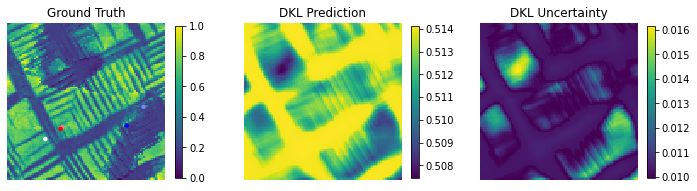

3/3
Epoch 1/200 ... Training loss: 0.9474
Epoch 10/200 ... Training loss: 0.8986
Epoch 20/200 ... Training loss: 0.8509
Epoch 30/200 ... Training loss: 0.8014
Epoch 40/200 ... Training loss: 0.759
Epoch 50/200 ... Training loss: 0.7078
Epoch 60/200 ... Training loss: 0.6623
Epoch 70/200 ... Training loss: 0.6172
Epoch 80/200 ... Training loss: 0.5725
Epoch 90/200 ... Training loss: 0.5278
Epoch 100/200 ... Training loss: 0.4837
Epoch 110/200 ... Training loss: 0.4399
Epoch 120/200 ... Training loss: 0.3965
Epoch 130/200 ... Training loss: 0.3538
Epoch 140/200 ... Training loss: 0.3119
Epoch 150/200 ... Training loss: 0.2705
Epoch 160/200 ... Training loss: 0.2291
Epoch 170/200 ... Training loss: 0.1762
Epoch 180/200 ... Training loss: 0.1315
Epoch 190/200 ... Training loss: 0.0859
Epoch 200/200 ... Training loss: 0.0451


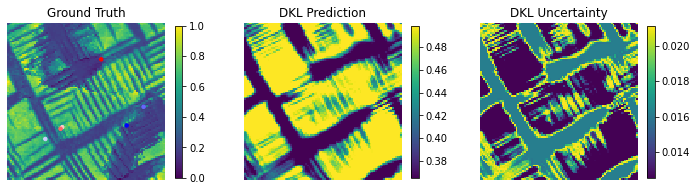

1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


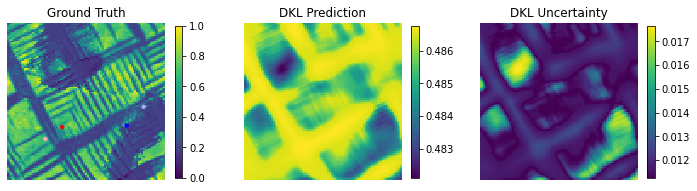

2/3
Epoch 1/200 ... Training loss: 0.9655
Epoch 10/200 ... Training loss: 0.9066
Epoch 20/200 ... Training loss: 0.8529
Epoch 30/200 ... Training loss: 0.7998
Epoch 40/200 ... Training loss: 0.7481
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.651
Epoch 70/200 ... Training loss: 0.6046
Epoch 80/200 ... Training loss: 0.5578
Epoch 90/200 ... Training loss: 0.511
Epoch 100/200 ... Training loss: 0.4638
Epoch 110/200 ... Training loss: 0.4171
Epoch 120/200 ... Training loss: 0.3707
Epoch 130/200 ... Training loss: 0.3245
Epoch 140/200 ... Training loss: 0.2788
Epoch 150/200 ... Training loss: 0.2338
Epoch 160/200 ... Training loss: 0.1896
Epoch 170/200 ... Training loss: 0.1463
Epoch 180/200 ... Training loss: 0.1042
Epoch 190/200 ... Training loss: 0.0632
Epoch 200/200 ... Training loss: 0.0234


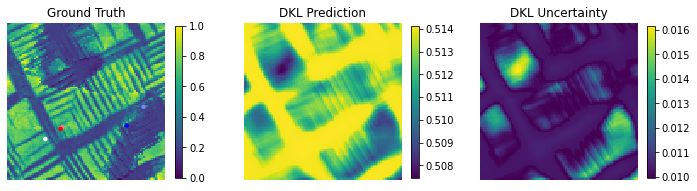

3/3
Epoch 1/200 ... Training loss: 0.9474
Epoch 10/200 ... Training loss: 0.8986
Epoch 20/200 ... Training loss: 0.8509
Epoch 30/200 ... Training loss: 0.8014
Epoch 40/200 ... Training loss: 0.759
Epoch 50/200 ... Training loss: 0.7078
Epoch 60/200 ... Training loss: 0.6623
Epoch 70/200 ... Training loss: 0.6172
Epoch 80/200 ... Training loss: 0.5725
Epoch 90/200 ... Training loss: 0.5278
Epoch 100/200 ... Training loss: 0.4837
Epoch 110/200 ... Training loss: 0.4399
Epoch 120/200 ... Training loss: 0.3965
Epoch 130/200 ... Training loss: 0.3538
Epoch 140/200 ... Training loss: 0.3119
Epoch 150/200 ... Training loss: 0.2705
Epoch 160/200 ... Training loss: 0.2291
Epoch 170/200 ... Training loss: 0.1762
Epoch 180/200 ... Training loss: 0.1315
Epoch 190/200 ... Training loss: 0.0859
Epoch 200/200 ... Training loss: 0.0451


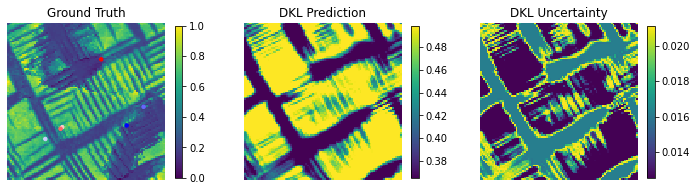

1/3
Epoch 1/200 ... Training loss: 0.9885
Epoch 10/200 ... Training loss: 0.9224
Epoch 20/200 ... Training loss: 0.8682
Epoch 30/200 ... Training loss: 0.8144
Epoch 40/200 ... Training loss: 0.7625
Epoch 50/200 ... Training loss: 0.7128
Epoch 60/200 ... Training loss: 0.6652
Epoch 70/200 ... Training loss: 0.6181
Epoch 80/200 ... Training loss: 0.5712
Epoch 90/200 ... Training loss: 0.524
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4304
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3382
Epoch 140/200 ... Training loss: 0.2931
Epoch 150/200 ... Training loss: 0.2487
Epoch 160/200 ... Training loss: 0.2053
Epoch 170/200 ... Training loss: 0.163
Epoch 180/200 ... Training loss: 0.122
Epoch 190/200 ... Training loss: 0.0824
Epoch 200/200 ... Training loss: 0.0441


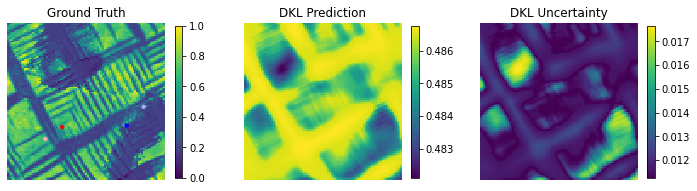

2/3
Epoch 1/200 ... Training loss: 0.9655
Epoch 10/200 ... Training loss: 0.9066
Epoch 20/200 ... Training loss: 0.8529
Epoch 30/200 ... Training loss: 0.7998
Epoch 40/200 ... Training loss: 0.7481
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.651
Epoch 70/200 ... Training loss: 0.6046
Epoch 80/200 ... Training loss: 0.5578
Epoch 90/200 ... Training loss: 0.511
Epoch 100/200 ... Training loss: 0.4638
Epoch 110/200 ... Training loss: 0.4171
Epoch 120/200 ... Training loss: 0.3707
Epoch 130/200 ... Training loss: 0.3245
Epoch 140/200 ... Training loss: 0.2788
Epoch 150/200 ... Training loss: 0.2338
Epoch 160/200 ... Training loss: 0.1896
Epoch 170/200 ... Training loss: 0.1463
Epoch 180/200 ... Training loss: 0.1042
Epoch 190/200 ... Training loss: 0.0632
Epoch 200/200 ... Training loss: 0.0234


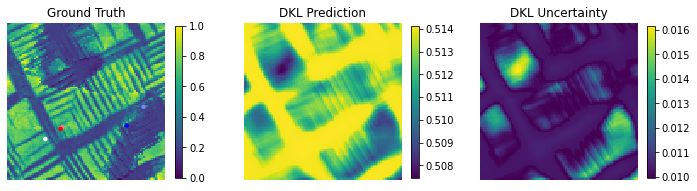

3/3
Epoch 1/200 ... Training loss: 0.9474
Epoch 10/200 ... Training loss: 0.8986
Epoch 20/200 ... Training loss: 0.8509
Epoch 30/200 ... Training loss: 0.8014
Epoch 40/200 ... Training loss: 0.759
Epoch 50/200 ... Training loss: 0.7078
Epoch 60/200 ... Training loss: 0.6623
Epoch 70/200 ... Training loss: 0.6172
Epoch 80/200 ... Training loss: 0.5725
Epoch 90/200 ... Training loss: 0.5278
Epoch 100/200 ... Training loss: 0.4837
Epoch 110/200 ... Training loss: 0.4399
Epoch 120/200 ... Training loss: 0.3965
Epoch 130/200 ... Training loss: 0.3538
Epoch 140/200 ... Training loss: 0.3119
Epoch 150/200 ... Training loss: 0.2705
Epoch 160/200 ... Training loss: 0.2291
Epoch 170/200 ... Training loss: 0.1762
Epoch 180/200 ... Training loss: 0.1315
Epoch 190/200 ... Training loss: 0.0859
Epoch 200/200 ... Training loss: 0.0451


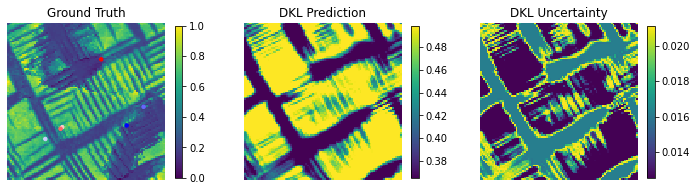

In [ ]:
# Set hysteresis loop width as target property
y_targ = loop_width     #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random1 = "/random_loopwidth_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random1)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random1)

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


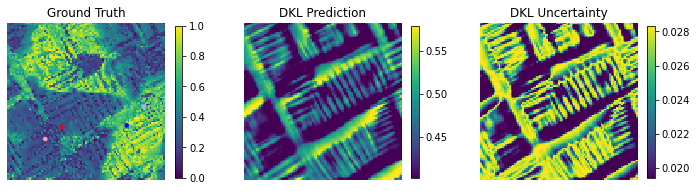

2/3
Epoch 1/200 ... Training loss: 0.9875
Epoch 10/200 ... Training loss: 0.9357
Epoch 20/200 ... Training loss: 0.887
Epoch 30/200 ... Training loss: 0.8384
Epoch 40/200 ... Training loss: 0.7935
Epoch 50/200 ... Training loss: 0.7507
Epoch 60/200 ... Training loss: 0.7099
Epoch 70/200 ... Training loss: 0.6697
Epoch 80/200 ... Training loss: 0.6298
Epoch 90/200 ... Training loss: 0.5878
Epoch 100/200 ... Training loss: 0.5258
Epoch 110/200 ... Training loss: 0.483
Epoch 120/200 ... Training loss: 0.4398
Epoch 130/200 ... Training loss: 0.3986
Epoch 140/200 ... Training loss: 0.3597
Epoch 150/200 ... Training loss: 0.3227
Epoch 160/200 ... Training loss: 0.2879
Epoch 170/200 ... Training loss: 0.2553
Epoch 180/200 ... Training loss: 0.225
Epoch 190/200 ... Training loss: 0.1969
Epoch 200/200 ... Training loss: 0.171


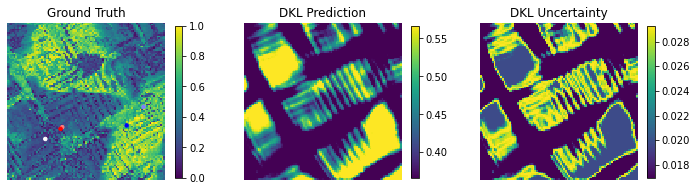

3/3
Epoch 1/200 ... Training loss: 0.9595
Epoch 10/200 ... Training loss: 0.9155
Epoch 20/200 ... Training loss: 0.8708
Epoch 30/200 ... Training loss: 0.8208
Epoch 40/200 ... Training loss: 0.7742
Epoch 50/200 ... Training loss: 0.7346
Epoch 60/200 ... Training loss: 0.6925
Epoch 70/200 ... Training loss: 0.6526
Epoch 80/200 ... Training loss: 0.6115
Epoch 90/200 ... Training loss: 0.5726
Epoch 100/200 ... Training loss: 0.5338
Epoch 110/200 ... Training loss: 0.4954
Epoch 120/200 ... Training loss: 0.4547
Epoch 130/200 ... Training loss: 0.4054
Epoch 140/200 ... Training loss: 0.3497
Epoch 150/200 ... Training loss: 0.3076
Epoch 160/200 ... Training loss: 0.2684
Epoch 170/200 ... Training loss: 0.2316
Epoch 180/200 ... Training loss: 0.1968
Epoch 190/200 ... Training loss: 0.1641
Epoch 200/200 ... Training loss: 0.1333


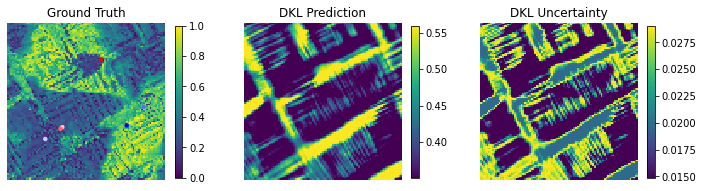

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


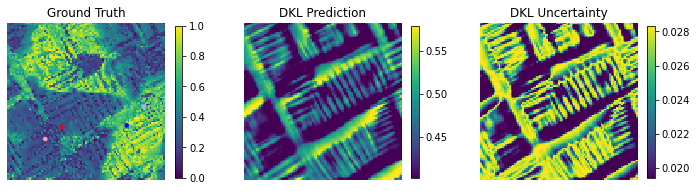

2/3
Epoch 1/200 ... Training loss: 0.9875
Epoch 10/200 ... Training loss: 0.9357
Epoch 20/200 ... Training loss: 0.887
Epoch 30/200 ... Training loss: 0.8384
Epoch 40/200 ... Training loss: 0.7935
Epoch 50/200 ... Training loss: 0.7507
Epoch 60/200 ... Training loss: 0.7099
Epoch 70/200 ... Training loss: 0.6697
Epoch 80/200 ... Training loss: 0.6298
Epoch 90/200 ... Training loss: 0.5878
Epoch 100/200 ... Training loss: 0.5258
Epoch 110/200 ... Training loss: 0.483
Epoch 120/200 ... Training loss: 0.4398
Epoch 130/200 ... Training loss: 0.3986
Epoch 140/200 ... Training loss: 0.3597
Epoch 150/200 ... Training loss: 0.3227
Epoch 160/200 ... Training loss: 0.2879
Epoch 170/200 ... Training loss: 0.2553
Epoch 180/200 ... Training loss: 0.225
Epoch 190/200 ... Training loss: 0.1969
Epoch 200/200 ... Training loss: 0.171


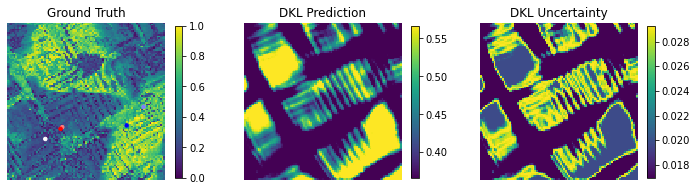

3/3
Epoch 1/200 ... Training loss: 0.9595
Epoch 10/200 ... Training loss: 0.9155
Epoch 20/200 ... Training loss: 0.8708
Epoch 30/200 ... Training loss: 0.8208
Epoch 40/200 ... Training loss: 0.7742
Epoch 50/200 ... Training loss: 0.7346
Epoch 60/200 ... Training loss: 0.6925
Epoch 70/200 ... Training loss: 0.6526
Epoch 80/200 ... Training loss: 0.6115
Epoch 90/200 ... Training loss: 0.5726
Epoch 100/200 ... Training loss: 0.5338
Epoch 110/200 ... Training loss: 0.4954
Epoch 120/200 ... Training loss: 0.4547
Epoch 130/200 ... Training loss: 0.4054
Epoch 140/200 ... Training loss: 0.3497
Epoch 150/200 ... Training loss: 0.3076
Epoch 160/200 ... Training loss: 0.2684
Epoch 170/200 ... Training loss: 0.2316
Epoch 180/200 ... Training loss: 0.1968
Epoch 190/200 ... Training loss: 0.1641
Epoch 200/200 ... Training loss: 0.1333


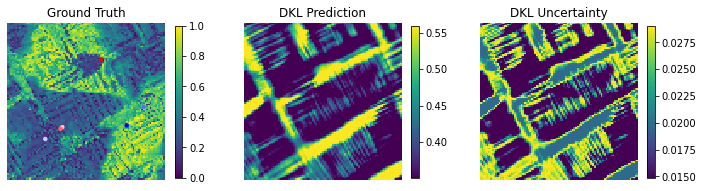

1/3
Epoch 1/200 ... Training loss: 1.0248
Epoch 10/200 ... Training loss: 0.9655
Epoch 20/200 ... Training loss: 0.9147
Epoch 30/200 ... Training loss: 0.865
Epoch 40/200 ... Training loss: 0.8174
Epoch 50/200 ... Training loss: 0.7726
Epoch 60/200 ... Training loss: 0.7305
Epoch 70/200 ... Training loss: 0.69
Epoch 80/200 ... Training loss: 0.6504
Epoch 90/200 ... Training loss: 0.6116
Epoch 100/200 ... Training loss: 0.5736
Epoch 110/200 ... Training loss: 0.5094
Epoch 120/200 ... Training loss: 0.4676
Epoch 130/200 ... Training loss: 0.4278
Epoch 140/200 ... Training loss: 0.3908
Epoch 150/200 ... Training loss: 0.356
Epoch 160/200 ... Training loss: 0.3239
Epoch 170/200 ... Training loss: 0.2944
Epoch 180/200 ... Training loss: 0.2676
Epoch 190/200 ... Training loss: 0.2435
Epoch 200/200 ... Training loss: 0.2219


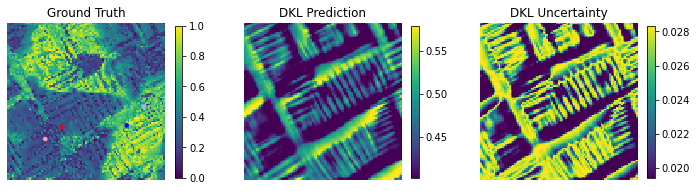

2/3
Epoch 1/200 ... Training loss: 0.9875
Epoch 10/200 ... Training loss: 0.9357
Epoch 20/200 ... Training loss: 0.887
Epoch 30/200 ... Training loss: 0.8384
Epoch 40/200 ... Training loss: 0.7935
Epoch 50/200 ... Training loss: 0.7507
Epoch 60/200 ... Training loss: 0.7099
Epoch 70/200 ... Training loss: 0.6697
Epoch 80/200 ... Training loss: 0.6298
Epoch 90/200 ... Training loss: 0.5878
Epoch 100/200 ... Training loss: 0.5258
Epoch 110/200 ... Training loss: 0.483
Epoch 120/200 ... Training loss: 0.4398
Epoch 130/200 ... Training loss: 0.3986
Epoch 140/200 ... Training loss: 0.3597
Epoch 150/200 ... Training loss: 0.3227
Epoch 160/200 ... Training loss: 0.2879
Epoch 170/200 ... Training loss: 0.2553
Epoch 180/200 ... Training loss: 0.225
Epoch 190/200 ... Training loss: 0.1969
Epoch 200/200 ... Training loss: 0.171


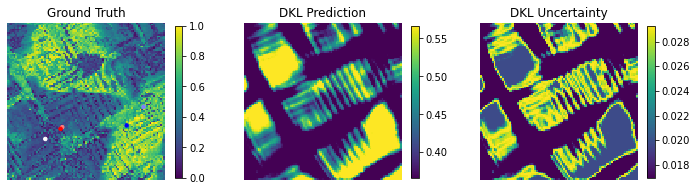

3/3
Epoch 1/200 ... Training loss: 0.9595
Epoch 10/200 ... Training loss: 0.9155
Epoch 20/200 ... Training loss: 0.8708
Epoch 30/200 ... Training loss: 0.8208
Epoch 40/200 ... Training loss: 0.7742
Epoch 50/200 ... Training loss: 0.7346
Epoch 60/200 ... Training loss: 0.6925
Epoch 70/200 ... Training loss: 0.6526
Epoch 80/200 ... Training loss: 0.6115
Epoch 90/200 ... Training loss: 0.5726
Epoch 100/200 ... Training loss: 0.5338
Epoch 110/200 ... Training loss: 0.4954
Epoch 120/200 ... Training loss: 0.4547
Epoch 130/200 ... Training loss: 0.4054
Epoch 140/200 ... Training loss: 0.3497
Epoch 150/200 ... Training loss: 0.3076
Epoch 160/200 ... Training loss: 0.2684
Epoch 170/200 ... Training loss: 0.2316
Epoch 180/200 ... Training loss: 0.1968
Epoch 190/200 ... Training loss: 0.1641
Epoch 200/200 ... Training loss: 0.1333


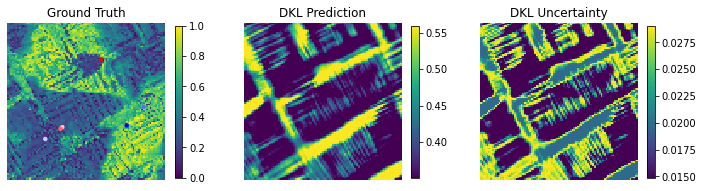

In [ ]:
# Set coercive field as target property
y_targ = coercive_field    #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random2 = "/random_coercivefield_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random2)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random2)

## Step 4: Compare the performance of matured DKL (i.e. the DKL model at the end of exploration--at 200 step in this work) and real time DKL model.

In [ ]:
#@title define a function to run dkl counterfactual with different scalarizer
def dkl_mature_full(y, save_mature_full):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  
  # Load last step train dataset  
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  rec = np.load("final_traindata.npz")
  X_train = rec["X_train"]
  y_train = rec["y_train"]

  # Train a matured DKL model with the last step train dataset
  # dklgp0 will be the matured DKL model
  dklgp0 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp0.fit(X_train, y_train, training_cycles=200)

  # Train a full-informed DKL model with all data
  # dklgp1 will be the full-informed DKL model
  dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp1.fit(X, y, training_cycles=200)

  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result 
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_mature_full):
    os.mkdir(rf + acq_funcs[acq_idx] + save_mature_full)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    #update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, lr = 0.01)
    
    mean, var = dklgp.predict(X_test, batch_size=len(X_test))  #real-time DKL model
    mean0, var0 = dklgp0.predict(X_test, batch_size=len(X_test)) #matured DKL model
    mean1, var1 = dklgp1.predict(X_test, batch_size=len(X_test)) #full-informed DKL model

    # Load measurement location from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

        # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_mature_full)
    np.savez("record{}.npz".format(e), y_test = y_test, 
             mean = mean, var = var, 
             mean0 = mean0, var0 = var0, 
             mean1 = mean1, var1 = var1)
    
    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train, 
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test, 
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point = next_point)
    

In [ ]:
# Set loop area as target property
y_targ = loop_area_off    #training output; 
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_mature_full = "/mature_full_record/"

# run real-time DKL, mature DKL, and full DKL with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_mature_full(y, save_mature_full)   

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_mature_full(y, save_mature_full)

Epoch 1/200 ... Training loss: 0.9406
Epoch 10/200 ... Training loss: 0.8838
Epoch 20/200 ... Training loss: 0.8364
Epoch 30/200 ... Training loss: 0.7908
Epoch 40/200 ... Training loss: 0.7439
Epoch 50/200 ... Training loss: 0.6993
Epoch 60/200 ... Training loss: 0.658
Epoch 70/200 ... Training loss: 0.6159
Epoch 80/200 ... Training loss: 0.5722
Epoch 90/200 ... Training loss: 0.5295
Epoch 100/200 ... Training loss: 0.4869
Epoch 110/200 ... Training loss: 0.4443
Epoch 120/200 ... Training loss: 0.4019
Epoch 130/200 ... Training loss: 0.3596
Epoch 140/200 ... Training loss: 0.3173
Epoch 150/200 ... Training loss: 0.275
Epoch 160/200 ... Training loss: 0.2325
Epoch 170/200 ... Training loss: 0.1898
Epoch 180/200 ... Training loss: 0.1477
Epoch 190/200 ... Training loss: 0.1068
Epoch 200/200 ... Training loss: 0.0663
Epoch 1/200 ... Training loss: 0.7748


/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)


Epoch 10/200 ... Training loss: 0.7287
Epoch 20/200 ... Training loss: 0.6924
Epoch 30/200 ... Training loss: 0.6555
Epoch 40/200 ... Training loss: 0.6176
Epoch 50/200 ... Training loss: 0.5788
Epoch 60/200 ... Training loss: 0.54
Epoch 70/200 ... Training loss: 0.5003
Epoch 80/200 ... Training loss: 0.4588
Epoch 90/200 ... Training loss: 0.416
Epoch 100/200 ... Training loss: 0.3756
Epoch 110/200 ... Training loss: 0.3296
Epoch 120/200 ... Training loss: 0.2832
Epoch 130/200 ... Training loss: 0.2398
Epoch 140/200 ... Training loss: 0.1929
Epoch 150/200 ... Training loss: 0.1469
Epoch 160/200 ... Training loss: 0.1024
Epoch 170/200 ... Training loss: 0.0544
Epoch 180/200 ... Training loss: 0.008
Epoch 190/200 ... Training loss: -0.0377
Epoch 200/200 ... Training loss: -0.0859
1/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 ... Training loss: 0.7793
Epoch 50/200 ...

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)


Epoch 10/200 ... Training loss: 0.7295
Epoch 20/200 ... Training loss: 0.6936
Epoch 30/200 ... Training loss: 0.6568
Epoch 40/200 ... Training loss: 0.6182
Epoch 50/200 ... Training loss: 0.5798
Epoch 60/200 ... Training loss: 0.5405
Epoch 70/200 ... Training loss: 0.501
Epoch 80/200 ... Training loss: 0.4591
Epoch 90/200 ... Training loss: 0.4168
Epoch 100/200 ... Training loss: 0.3723
Epoch 110/200 ... Training loss: 0.3269
Epoch 120/200 ... Training loss: 0.2857
Epoch 130/200 ... Training loss: 0.2402
Epoch 140/200 ... Training loss: 0.1936
Epoch 150/200 ... Training loss: 0.1483
Epoch 160/200 ... Training loss: 0.1024
Epoch 170/200 ... Training loss: 0.0556
Epoch 180/200 ... Training loss: 0.01
Epoch 190/200 ... Training loss: -0.0359
Epoch 200/200 ... Training loss: -0.0827
1/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 ... Training loss: 0.7793
Epoch 50/200 ..

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)


Epoch 1/200 ... Training loss: 0.7748
Epoch 10/200 ... Training loss: 0.7287
Epoch 20/200 ... Training loss: 0.698
Epoch 30/200 ... Training loss: 0.6561
Epoch 40/200 ... Training loss: 0.6183
Epoch 50/200 ... Training loss: 0.5799
Epoch 60/200 ... Training loss: 0.5406
Epoch 70/200 ... Training loss: 0.5004
Epoch 80/200 ... Training loss: 0.4593
Epoch 90/200 ... Training loss: 0.4172
Epoch 100/200 ... Training loss: 0.3741
Epoch 110/200 ... Training loss: 0.3301
Epoch 120/200 ... Training loss: 0.2846
Epoch 130/200 ... Training loss: 0.2406
Epoch 140/200 ... Training loss: 0.1927
Epoch 150/200 ... Training loss: 0.1466
Epoch 160/200 ... Training loss: 0.1024
Epoch 170/200 ... Training loss: 0.0542
Epoch 180/200 ... Training loss: 0.0084
Epoch 190/200 ... Training loss: -0.0387
Epoch 200/200 ... Training loss: -0.0857
1/3
Epoch 1/200 ... Training loss: 0.9799
Epoch 10/200 ... Training loss: 0.9195
Epoch 20/200 ... Training loss: 0.87
Epoch 30/200 ... Training loss: 0.824
Epoch 40/200 .

## Zip and download all results


In [ ]:
# !zip -r /content/BEPSws8.zip /content/rf   #zip the root folder

# from google.colab import files
# files.download("/content/BEPSws8.zip")  #download to local

  adding: content/rf/ (stored 0%)
  adding: content/rf/MU/ (stored 0%)
  adding: content/rf/MU/random_loopwidth_record/ (stored 0%)
  adding: content/rf/MU/random_loopwidth_record/record1.npz (deflated 26%)
  adding: content/rf/MU/random_loopwidth_record/final_traindata.npz (deflated 37%)
  adding: content/rf/MU/random_loopwidth_record/initial_traindata.npz (deflated 37%)
  adding: content/rf/MU/random_loopwidth_record/record0.npz (deflated 24%)
  adding: content/rf/MU/random_loopwidth_record/record2.npz (deflated 51%)
  adding: content/rf/MU/counter_coercivefield_record/ (stored 0%)
  adding: content/rf/MU/counter_coercivefield_record/record1.npz (deflated 59%)
  adding: content/rf/MU/counter_coercivefield_record/final_traindata.npz (deflated 38%)
  adding: content/rf/MU/counter_coercivefield_record/initial_traindata.npz (deflated 38%)
  adding: content/rf/MU/counter_coercivefield_record/record0.npz (deflated 29%)
  adding: content/rf/MU/counter_coercivefield_record/record2.npz (defla

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



# Step 5. Analysis

In [12]:
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/ziatdinovmax/pyroved.git to /tmp/pip-req-build-1n83jcz_
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/pyroved.git /tmp/pip-req-build-1n83jcz_
  Resolved https://github.com/ziatdinovmax/pyroved.git to commit f842ebf0205b79d4c8b791defe0546bd24c1c4aa
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 730.7/730.7 KB 13.3 MB/s eta 0:00:00
  Created wheel for pyroved: filename=pyroved-0.2.3-py3-none-any.whl size=48283 sha256=66686aa0f160bf2778cd3afb7d12033025fbeca16f693ca519f21a7fc6434c2b
  Stored in directory: /tmp/pip-ephem-wheel-cache-703uho1g/wheels/cc/77/55/6821a6229b1b206384a859b795be313ae81bfe2b82228d76a6
Successfully built pyroved


In [18]:
# rf = '/content/rf/'   #root folder
# save_explore =  "/explore_dkl_record/"
# save_counter1 = "/counter_loopwidth_record/"
# save_counter2 = "/counter_coercivefield_record/"
# save_random1 = "/random_loopwidth_record/"
# save_random2 = "/random_coercivefield_record/"
# save_mature_full = "/mature_full_record/"

# !gdown https://drive.google.com/uc?id=1jtp9_T8K6sXqqdqMbIOr29eD1slaCIeu

# !unzip rf.zip

# exploration_steps = 200

Downloading...
From: https://drive.google.com/uc?id=1jtp9_T8K6sXqqdqMbIOr29eD1slaCIeu
To: /content/rf.zip
100% 414M/414M [00:01<00:00, 211MB/s]
Archive:  rf.zip
replace rf/EI/counter_coercivefield_record/final_traindata.npz? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: rf/EI/counter_coercivefield_record/final_traindata.npz  
  inflating: rf/EI/counter_coercivefield_record/initial_traindata.npz  
  inflating: rf/EI/counter_coercivefield_record/record0.npz  
  inflating: rf/EI/counter_coercivefield_record/record1.npz  
  inflating: rf/EI/counter_coercivefield_record/record10.npz  
  inflating: rf/EI/counter_coercivefield_record/record100.npz  
  inflating: rf/EI/counter_coercivefield_record/record101.npz  
  inflating: rf/EI/counter_coercivefield_record/record102.npz  
  inflating: rf/EI/counter_coercivefield_record/record103.npz  
  inflating: rf/EI/counter_coercivefield_record/record104.npz  
  inflating: rf/EI/counter_coercivefield_record/record105.npz  
  inflating: rf/EI/cou

In [14]:
import glob
from scipy import ndimage
import matplotlib.gridspec as gridspec
import pyroved as pv
import numpy as np
import matplotlib.pyplot as plt
import cv2
from atomai.utils import extract_patches_ 
import glob
from torch.autograd import Variable
import atomai as aoi

import torch
import torch.nn as nn
import torch.nn.functional as F

from copy import deepcopy as dc

import h5py

from scipy import ndimage
from sklearn import decomposition

import matplotlib as mpl

import os
from atomai import utils

## Step 5-1 Plot DKL results

Load results of real-time DKL, trained DKL, and Full-DKL

In [21]:
# Create array to save results of real time and matured DKL models
# save results from EI acuqisition funciton
var_compare = np.empty((3, 3, exploration_steps))  # uncertainty
var_dev_compare = np.empty((3, 3, exploration_steps)) # uncertainty variation
nextpoint_uncertainty_compare = np.empty((3, 3, exploration_steps)) # predicted next point uncertainty
nextpoint_measure_compare = np.empty((3, 3, exploration_steps)) # next point ground truth 
nextpoint_pred_compare = np.empty((3, 3, exploration_steps)) # next point prediction

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results of DKL
    rec = np.load("record{}.npz".format(i))
    var_compare[acq_idx, :, i] = rec['var'].mean(), rec['var0'].mean(), rec['var1'].mean()
    var_dev_compare[acq_idx, :, i] = np.std(rec['var']), np.std(rec['var0']), np.std(rec['var1'])
    nextpoint_uncertainty_compare[acq_idx, :, i] = rec['var'].max(), rec['var0'].max(), rec['var1'].max()
    nextpoint_measure_compare[acq_idx, :, i] = rec['y_test'][rec['var'].argmax()], rec['y_test'][rec['var0'].argmax()], rec['y_test'][rec['var1'].argmax()]
    nextpoint_pred_compare[acq_idx, :, i] = rec['mean'][rec['var'].argmax()], rec['mean0'][rec['var0'].argmax()], rec['mean1'][rec['var1'].argmax()]

Plot uncertainty (of each model) as a function of step

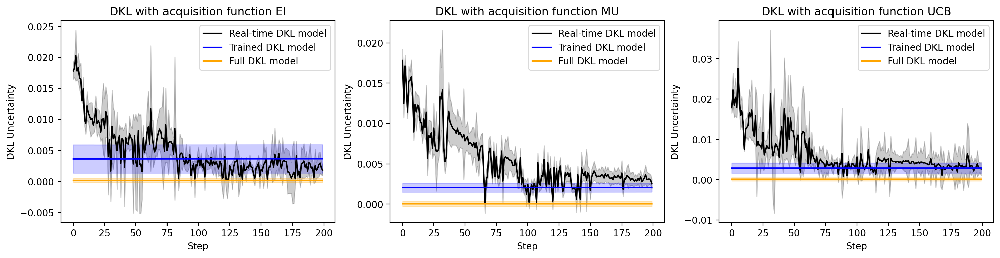

In [22]:
s = np.arange(exploration_steps) #step

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (18, 4), dpi = 200)

#Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, var_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.fill_between(s, var_compare[0, 0,]-var_dev_compare[0, 0,], 
                 var_compare[0, 0,]+var_dev_compare[0, 0,], color='black', alpha=0.2)
ax1.plot(s, var_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.fill_between(s, var_compare[0, 1,]-var_dev_compare[0, 1,],
                 var_compare[0, 1,]+var_dev_compare[0, 1,],  color='blue', alpha=0.2)
ax1.plot(s, var_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.fill_between(s, var_compare[0, 2,]-var_dev_compare[0, 2,],
                 var_compare[0, 2,]+var_dev_compare[0, 2,], color='orange', alpha=0.2)
ax1.set_ylabel("DKL Uncertainty")
ax1.set_xlabel('Step')
ax1.legend()

#Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, var_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.fill_between(s, var_compare[1, 0,]-var_dev_compare[1, 0,], 
                 var_compare[1, 0,]+var_dev_compare[1, 0,], color='black', alpha=0.2)
ax2.plot(s, var_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.fill_between(s, var_compare[1, 1,]-var_dev_compare[1, 1,],
                 var_compare[1, 1,]+var_dev_compare[1, 1,],  color='blue', alpha=0.2)
ax2.plot(s, var_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.fill_between(s, var_compare[1, 2,]-var_dev_compare[1, 2,],
                 var_compare[1, 2,]+var_dev_compare[1, 2,], color='orange', alpha=0.2)
ax2.set_ylabel("DKL Uncertainty")
ax2.set_xlabel('Step')
ax2.legend()

#Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, var_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.fill_between(s, var_compare[2, 0,]-var_dev_compare[2, 0,], 
                 var_compare[2, 0,]+var_dev_compare[2, 0,], color='black', alpha=0.2)
ax3.plot(s, var_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.fill_between(s, var_compare[2, 1,]-var_dev_compare[2, 1,],
                 var_compare[2, 1,]+var_dev_compare[2, 1,],  color='blue', alpha=0.2)
ax3.plot(s, var_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.fill_between(s, var_compare[2, 2,]-var_dev_compare[2, 2,],
                 var_compare[2, 2,]+var_dev_compare[2, 2,], color='orange', alpha=0.2)
ax3.set_ylabel("DKL Uncertainty")
ax3.set_xlabel('Step')
ax3.legend()

plt.show()

Plot the maximum uncertainty point from each model as a funciton of step. For now, the next point uncertainty is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

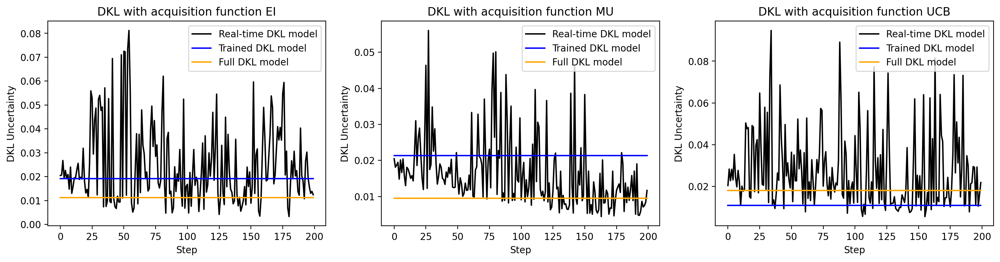

In [23]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_uncertainty_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("DKL Uncertainty"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_uncertainty_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("DKL Uncertainty"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_uncertainty_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("DKL Uncertainty"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point ground truth (ie. next measurement value)  from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

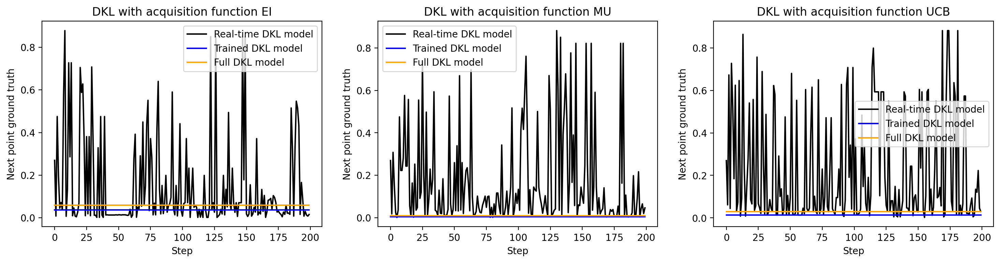

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_measure_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("Next point ground truth"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_measure_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("Next point ground truth"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_measure_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("Next point ground truth"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point prediciton from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

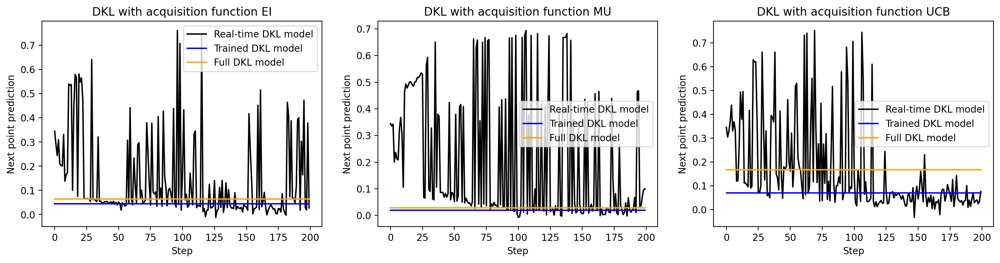

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_pred_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("Next point prediction"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_pred_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("Next point prediction"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_pred_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("Next point prediction"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Calculate regret: here I define regret as the difference between real-time DKL prediciton (mean) and trained DKL prediction (mean).



In [26]:
# Create array to save results of real time and matured DKL models
# save results from three acuqisition funciton
reg = np.empty((3, 2, exploration_steps))  # save the difference of predictions between real time DKL and trained DKL at each step; as well as deviation

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results
    rec = np.load("record{}.npz".format(i))
    mean_d = rec['mean']-rec['mean0']
    reg[acq_idx,:,i] = mean_d.mean(), np.std(mean_d)


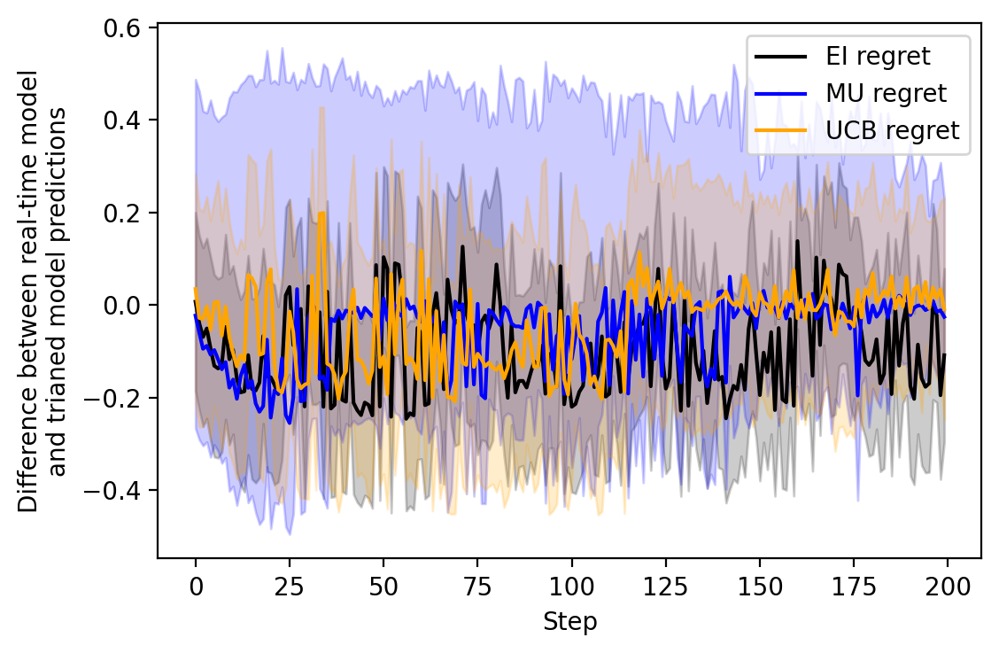

In [27]:
fig, ax = plt.subplots(figsize = (6, 4), dpi = 200)

ax.plot(s, reg[0,0,], c= 'black', label = "EI regret")
ax.fill_between(s, reg[0,0,]-reg[0,1,], reg[0,0,]+reg[0,1,], 
                color='black', alpha=0.2)

ax.plot(s, reg[1,0,], c= 'blue', label = "MU regret")
ax.fill_between(s, reg[1,0,]-reg[1,1,], reg[1,1,]+reg[1,1,], 
                color='blue', alpha=0.2)

ax.plot(s, reg[2,0,], c= 'orange', label = "UCB regret")
ax.fill_between(s, reg[2,0,]-reg[2,1,], reg[2,0,]+reg[2,1,], 
                color='orange', alpha=0.2)

ax.set_ylabel("Difference between real-time model\nand trianed model predictions")
ax.set_xlabel('Step')
plt.legend()
plt.show()

Structure similarity index between ground truth and prediciton

In [28]:
sim = np.zeros((3, 5, exploration_steps)) # structural similarity index
from skimage.metrics import structural_similarity as ssim

for acq_idx in range (3):
  for i in range (exploration_steps):
    os.chdir (rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_area_off)  # ground truth
    sim[acq_idx, 0, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Loop width DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_width)  # ground truth
    sim[acq_idx, 1, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Coercive field DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter2)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(coercive_field)  # ground truth
    sim[acq_idx, 2, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Loop width DKL analysis based on random locations
    os.chdir (rf + acq_funcs[acq_idx] + save_random1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_width)  # ground truth
    sim[acq_idx, 3, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # COercive field DKL analysis based on random locations
    os.chdir (rf + acq_funcs[acq_idx] + save_random2)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(coercive_field)  # ground truth
    sim[acq_idx, 4, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

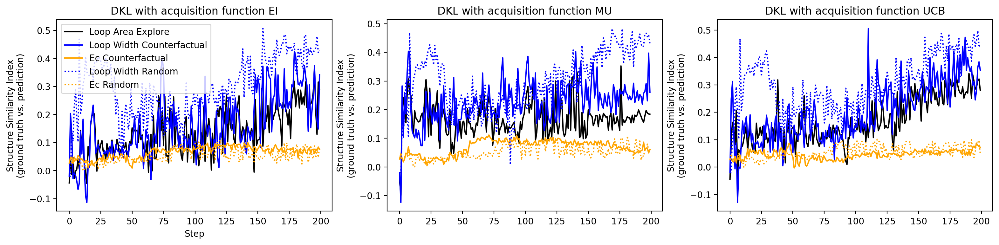

In [29]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (19, 4), dpi = 200)

s = np.arange(exploration_steps)
# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, sim[0, 0,], c= 'black', label = "Loop Area Explore")
ax1.plot(s, sim[0, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax1.plot(s, sim[0, 2,], c = 'orange', label = "Ec Counterfactual")
ax1.plot(s, sim[0, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax1.plot(s, sim[0, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax1.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, sim[1, 0,], c= 'black', label = "Loop Area Explore")
ax2.plot(s, sim[1, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax2.plot(s, sim[1, 2,], c = 'orange', label = "Ec Counterfactual")
ax2.plot(s, sim[1, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax2.plot(s, sim[1, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax2.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, sim[2, 0,], c= 'black', label = "Loop Area Explore")
ax3.plot(s, sim[2, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax3.plot(s, sim[2, 2,], c = 'orange', label = "Ec Counterfactual")
ax3.plot(s, sim[2, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax3.plot(s, sim[2, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax3.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

plt.show()

In [30]:
traj_EI = np.zeros((exploration_steps, 2))
traj_MU = np.zeros((exploration_steps, 2))
traj_UCB = np.zeros((exploration_steps, 2))

for i in range (exploration_steps):
  os.chdir (rf + acq_funcs[0] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_EI [i, ] = nextpoint

  os.chdir (rf + acq_funcs[1] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_MU [i, ] = nextpoint

  os.chdir (rf + acq_funcs[2] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_UCB [i, ] = nextpoint

(-0.5, 99.5, -0.5, 99.5)

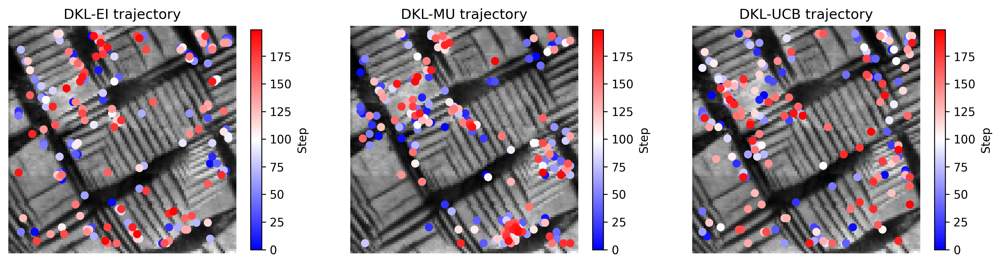

In [31]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)

cm = 'gray'
shrink = 0.7

ax1.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im1 = ax1.scatter(traj_EI[:,1], traj_EI[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im1, ax=ax1, shrink = shrink, label = "Step")
ax1.set_title("DKL-EI trajectory")
ax1.axis('off')

ax2.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im2 = ax2.scatter(traj_MU[:,1], traj_MU[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im2, ax=ax2, shrink = shrink, label = "Step")
ax2.set_title("DKL-MU trajectory")
ax2.axis('off')

ax3.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im3 = ax3.scatter(traj_UCB[:,1], traj_UCB[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im3, ax=ax3, shrink = shrink, label = "Step")
ax3.set_title("DKL-UCB trajectory")
ax3.axis('off')

## Step 5-2. rVAE analysis on DKL sampled data

EI sampled data

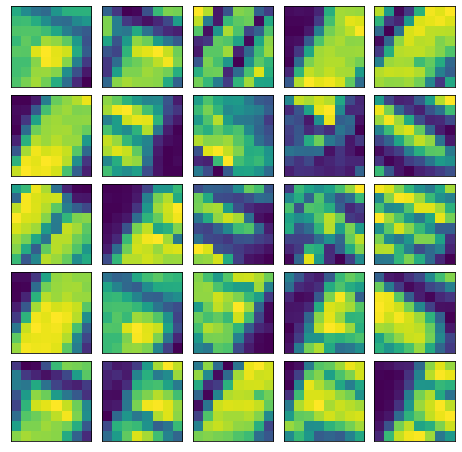

In [89]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[0] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_EI_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_EI_loader = pv.utils.init_dataloader(vae_EI_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_EI_data))
    ax.imshow(vae_EI_data[i].cpu(), interpolation='nearest')

In [90]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_EI = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_EI)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_EI_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 16205.5231
Epoch: 2 Training loss: 14006.5745
Epoch: 3 Training loss: 14200.7112
Epoch: 4 Training loss: 13188.3266
Epoch: 5 Training loss: 12566.3870
Epoch: 6 Training loss: 12175.7998
Epoch: 7 Training loss: 11525.6149
Epoch: 8 Training loss: 10904.6050
Epoch: 9 Training loss: 10330.5734
Epoch: 10 Training loss: 9909.8000
Epoch: 11 Training loss: 9735.7725
Epoch: 12 Training loss: 9652.6663
Epoch: 13 Training loss: 9719.0363
Epoch: 14 Training loss: 9405.2411
Epoch: 15 Training loss: 9205.0852
Epoch: 16 Training loss: 9137.9729
Epoch: 17 Training loss: 8831.2977
Epoch: 18 Training loss: 8697.2429
Epoch: 19 Training loss: 8429.2967
Epoch: 20 Training loss: 8245.2125
Epoch: 21 Training loss: 8118.0000
Epoch: 22 Training loss: 7850.3778
Epoch: 23 Training loss: 7521.7293
Epoch: 24 Training loss: 7399.4275
Epoch: 25 Training loss: 7254.7469
Epoch: 26 Training loss: 7009.6471
Epoch: 27 Training loss: 6834.6179
Epoch: 28 Training loss: 6987.5444
Epoch: 29 Training l

(0.0, 4.0)

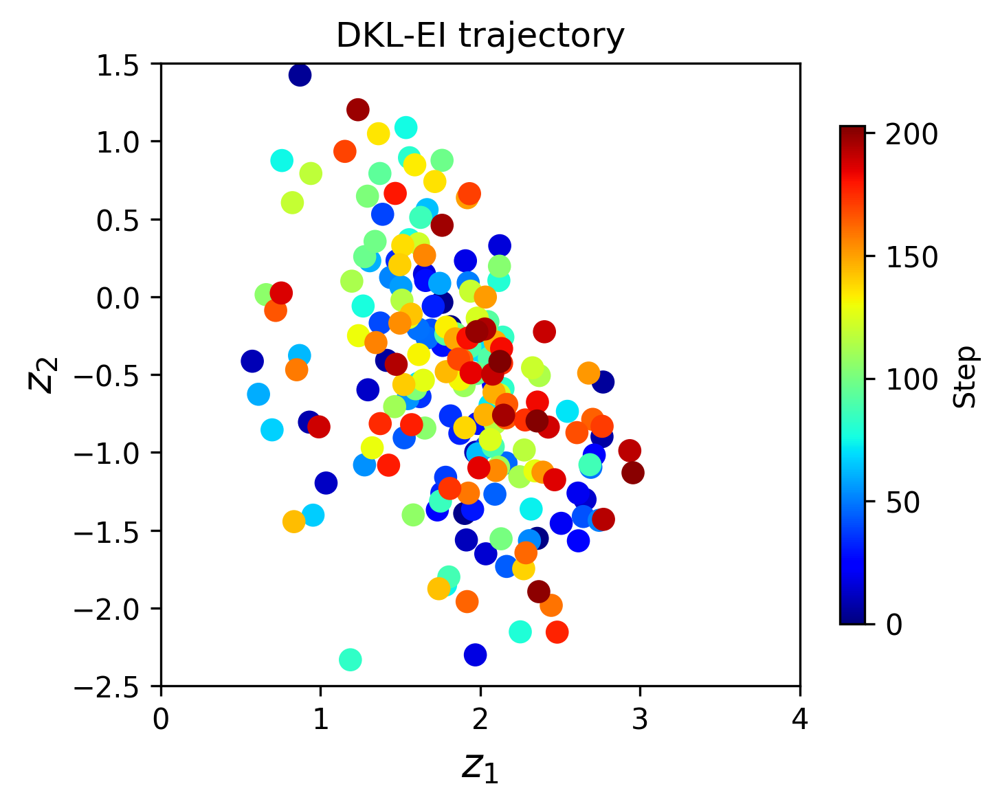

In [93]:
z_mean_EI, z_sd_EI = rvae_EI.encode(vae_EI_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_EI[:, -2], z_mean_EI[:, -1], s=50, c = np.arange(len(vae_EI_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
plt.colorbar(label = 'Step', shrink = 0.8)
plt.title("DKL-EI trajectory")
plt.ylim (-2.5, 1.5)
plt.xlim (0, 4.0)

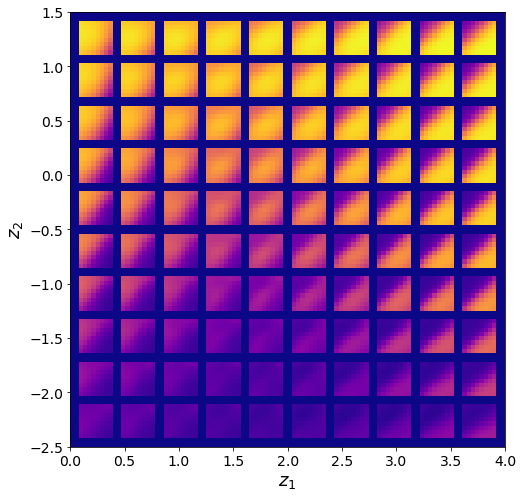

In [92]:
rvae_EI.manifold2d(10, 
                   z_coord = [0, 4, -2.5, 1.5], 
                   cmap = 'plasma', dpi = 300);

Maximum uncertainty sampled data

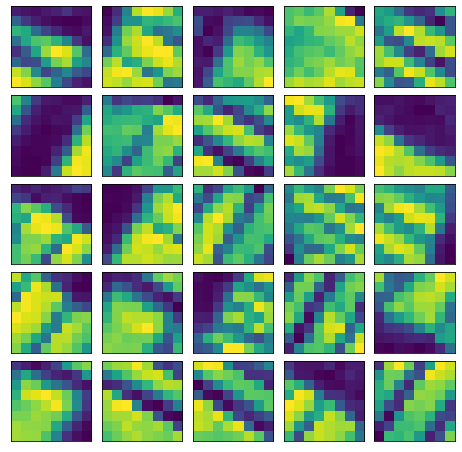

In [80]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[1] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_MU_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_MU_loader = pv.utils.init_dataloader(vae_MU_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_MU_data))
    ax.imshow(vae_MU_data[i].cpu(), interpolation='nearest')

In [81]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_MU = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_MU)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_MU_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 19656.8923
Epoch: 2 Training loss: 18376.8134
Epoch: 3 Training loss: 18252.7393
Epoch: 4 Training loss: 17374.2993
Epoch: 5 Training loss: 16113.4744
Epoch: 6 Training loss: 14880.4142
Epoch: 7 Training loss: 14516.4844
Epoch: 8 Training loss: 13645.6805
Epoch: 9 Training loss: 13446.7193
Epoch: 10 Training loss: 14473.3715
Epoch: 11 Training loss: 14137.5944
Epoch: 12 Training loss: 12803.3873
Epoch: 13 Training loss: 12049.2205
Epoch: 14 Training loss: 12160.0211
Epoch: 15 Training loss: 11974.0049
Epoch: 16 Training loss: 11513.5063
Epoch: 17 Training loss: 11306.0649
Epoch: 18 Training loss: 11279.4880
Epoch: 19 Training loss: 11081.4917
Epoch: 20 Training loss: 10888.2533
Epoch: 21 Training loss: 10748.2921
Epoch: 22 Training loss: 10570.7869
Epoch: 23 Training loss: 10403.6221
Epoch: 24 Training loss: 10240.5576
Epoch: 25 Training loss: 10142.3111
Epoch: 26 Training loss: 10135.4332
Epoch: 27 Training loss: 10086.7706
Epoch: 28 Training loss: 9924.8504
Ep

(-2.3, 1.2)

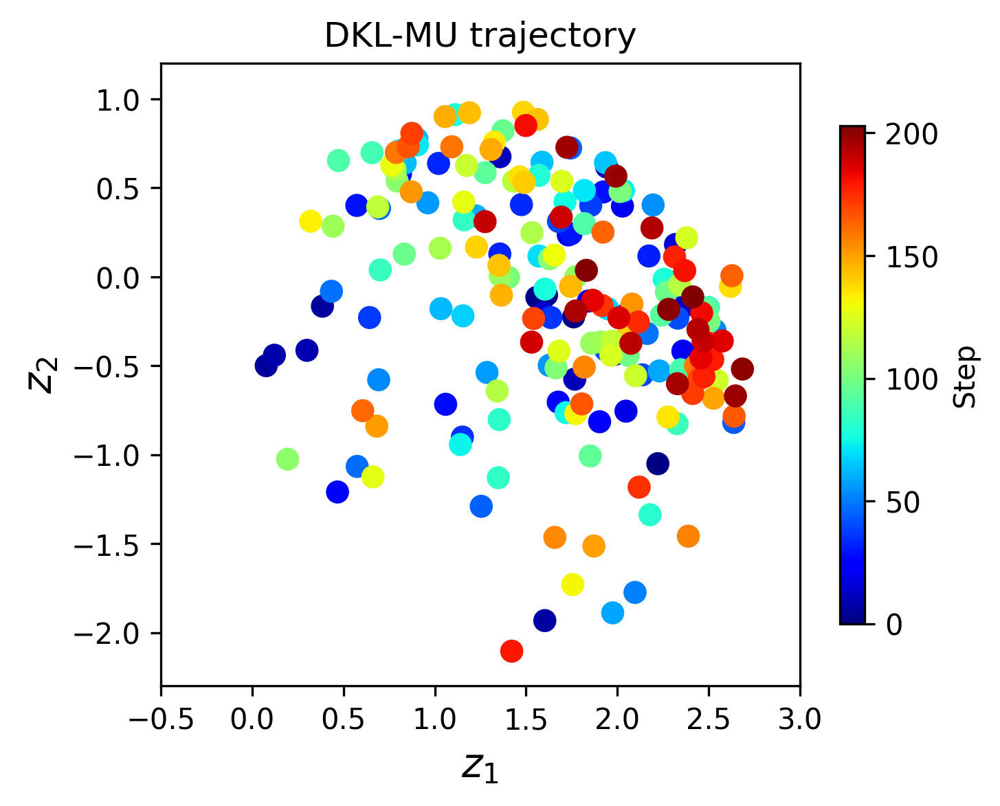

In [82]:
z_mean_MU, z_sd_MU = rvae_MU.encode(vae_MU_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_MU[:, -2], z_mean_MU[:, -1], s=50, c=np.arange(len(vae_MU_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
plt.colorbar(label = 'Step', shrink = 0.8)
plt.title("DKL-MU trajectory")
plt.xlim (-0.5,3)
plt.ylim (-2.3,1.2)

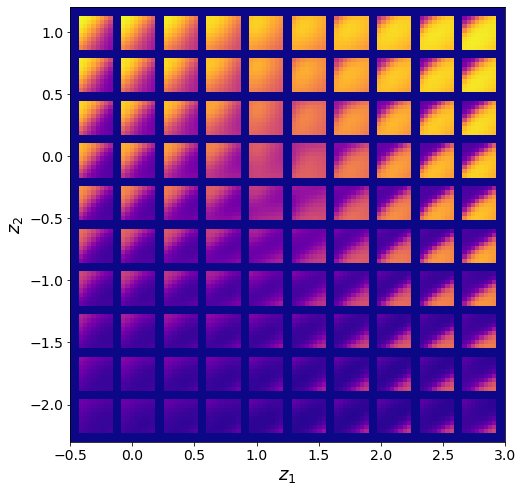

In [83]:
rvae_MU.manifold2d(10, 
                   z_coord = [-0.5, 3, -2.3, 1.2],
                   cmap = 'plasma', dpi = 300);

UCB sampled data

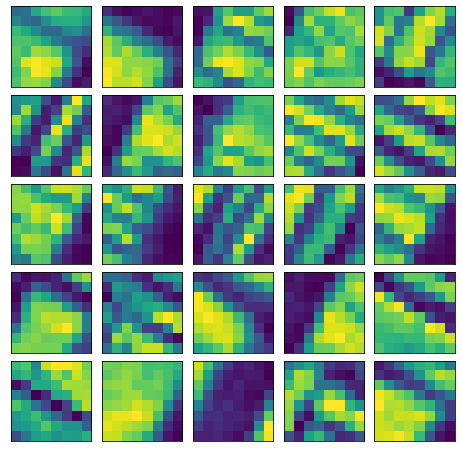

In [84]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[2] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_UCB_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_UCB_loader = pv.utils.init_dataloader(vae_UCB_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_UCB_data))
    ax.imshow(vae_UCB_data[i].cpu(), interpolation='nearest')

In [85]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_UCB = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_UCB)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_UCB_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 16479.1318
Epoch: 2 Training loss: 14659.0129
Epoch: 3 Training loss: 13578.1752
Epoch: 4 Training loss: 13552.3169
Epoch: 5 Training loss: 12421.2126
Epoch: 6 Training loss: 11802.3704
Epoch: 7 Training loss: 11246.6954
Epoch: 8 Training loss: 10860.4807
Epoch: 9 Training loss: 11383.5755
Epoch: 10 Training loss: 11472.2917
Epoch: 11 Training loss: 12015.6124
Epoch: 12 Training loss: 10502.2875
Epoch: 13 Training loss: 9762.6005
Epoch: 14 Training loss: 9712.2689
Epoch: 15 Training loss: 9600.1831
Epoch: 16 Training loss: 9353.3093
Epoch: 17 Training loss: 9099.5053
Epoch: 18 Training loss: 9106.8088
Epoch: 19 Training loss: 9051.5523
Epoch: 20 Training loss: 8953.6326
Epoch: 21 Training loss: 8888.2022
Epoch: 22 Training loss: 8848.2384
Epoch: 23 Training loss: 8774.2545
Epoch: 24 Training loss: 8738.0201
Epoch: 25 Training loss: 8692.3948
Epoch: 26 Training loss: 8598.5085
Epoch: 27 Training loss: 8646.8721
Epoch: 28 Training loss: 8661.4571
Epoch: 29 Trainin

Text(0.5, 1.0, 'DKL-UCB trajectory')

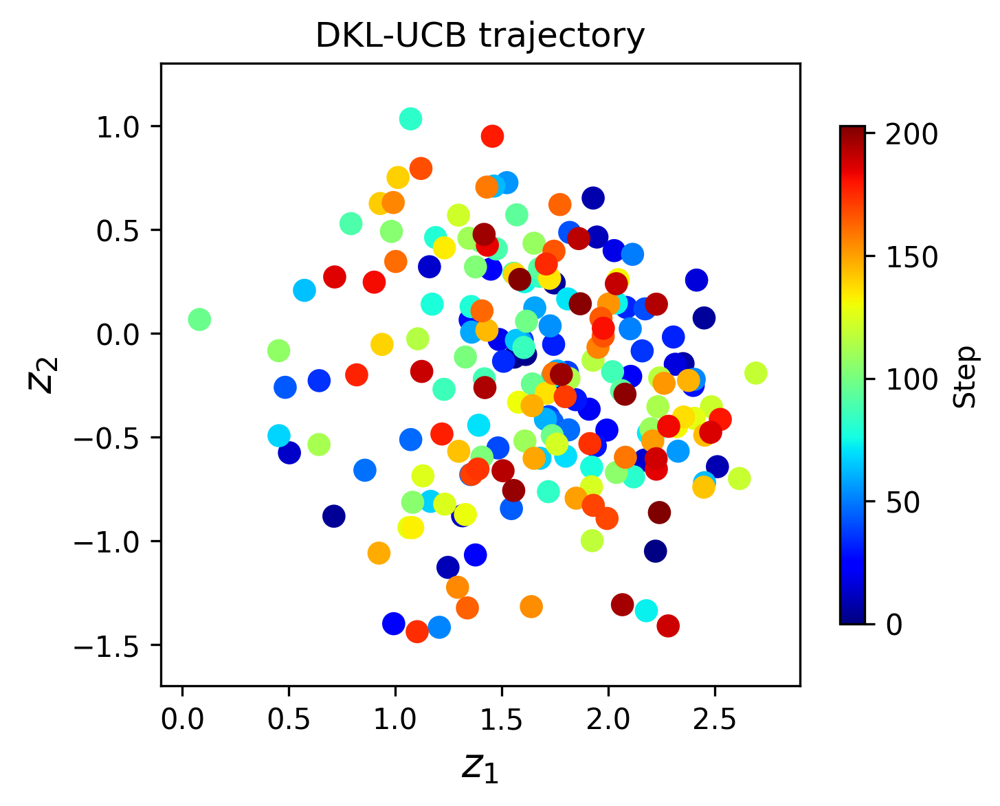

In [86]:
z_mean_UCB, z_sd_UCB = rvae_MU.encode(vae_UCB_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_UCB[:, -2], z_mean_UCB[:, -1], s=50, c=np.arange(len(vae_UCB_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
plt.xlim(-0.1,2.9)
plt.ylim(-1.7, 1.3)
plt.colorbar(label = "Step", shrink = 0.8)
plt.title("DKL-UCB trajectory")

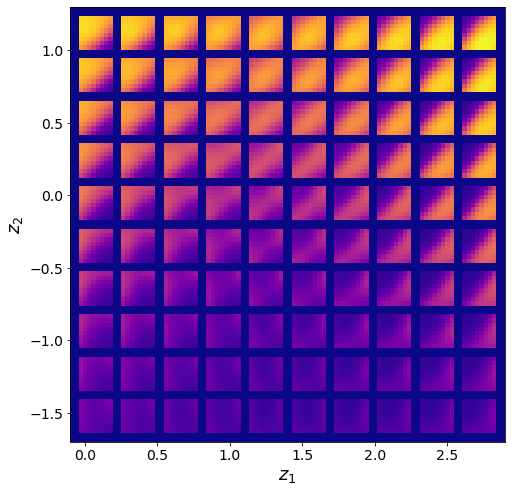

In [87]:
rvae_UCB.manifold2d(10, 
                    z_coord = [-0.1, 2.9, -1.7, 1.3],
                    cmap = 'plasma', dpi = 300);

rVAE analysis on all patches

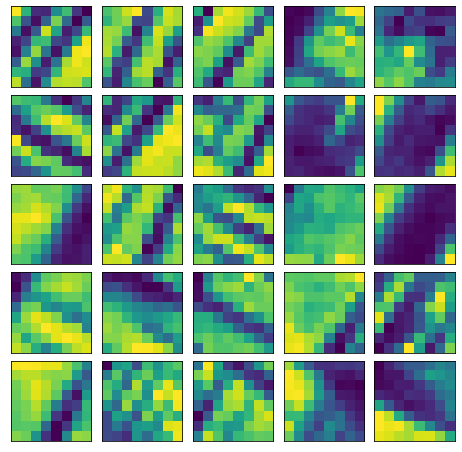

In [ ]:
# Initialize VAE train loader
vae_all_data = torch.tensor(X.reshape(-1, ws, ws)).float()
vae_all_loader = pv.utils.init_dataloader(vae_all_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_all_data))
    ax.imshow(vae_all_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_all = pv.models.iVAE(in_dim, latent_dim=2, invariances='r', 
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_all)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_all_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 7845.9312
Epoch: 2 Training loss: 5700.0388
Epoch: 3 Training loss: 4988.0443
Epoch: 4 Training loss: 4867.9556
Epoch: 5 Training loss: 4822.1599
Epoch: 6 Training loss: 4719.7319
Epoch: 7 Training loss: 4681.8109
Epoch: 8 Training loss: 4607.2847
Epoch: 9 Training loss: 4608.5691
Epoch: 10 Training loss: 4491.6678
Epoch: 11 Training loss: 4463.9565
Epoch: 12 Training loss: 4440.4648
Epoch: 13 Training loss: 4421.2314
Epoch: 14 Training loss: 4403.5070
Epoch: 15 Training loss: 4372.9897
Epoch: 16 Training loss: 4336.0323
Epoch: 17 Training loss: 4319.6170
Epoch: 18 Training loss: 4293.0064
Epoch: 19 Training loss: 4269.0813
Epoch: 20 Training loss: 4246.2696
Epoch: 21 Training loss: 4227.3101
Epoch: 22 Training loss: 4225.0014
Epoch: 23 Training loss: 4196.2228
Epoch: 24 Training loss: 4187.7504
Epoch: 25 Training loss: 4169.0071
Epoch: 26 Training loss: 4156.0413
Epoch: 27 Training loss: 4136.5354
Epoch: 28 Training loss: 4124.3459
Epoch: 29 Training loss: 4117

Text(0, 0.5, '$z_1$')

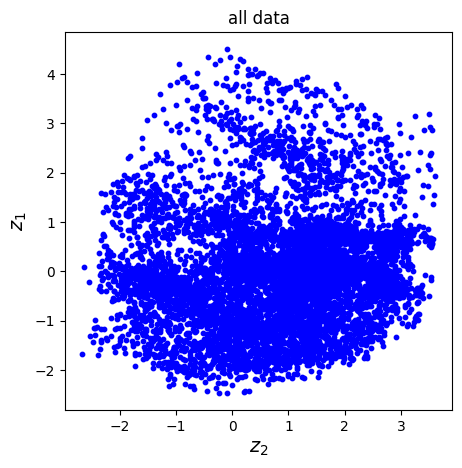

In [ ]:
z_mean_all, z_sd_all = rvae_all.encode(vae_all_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.title('all data')
plt.scatter(z_mean_all[:, -1], z_mean_all[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

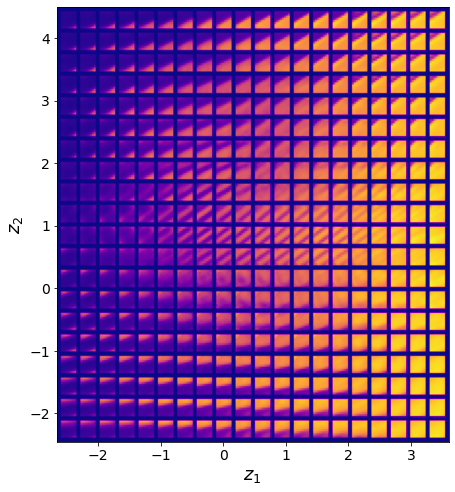

In [ ]:
rvae_all.manifold2d(20,
                    z_coord = [z_mean_all[:, -1].min(), z_mean_all[:, -1].max(), z_mean_all[:, -2].min(), z_mean_all[:, -2].max()],
                    cmap = 'plasma', dpi = 300);

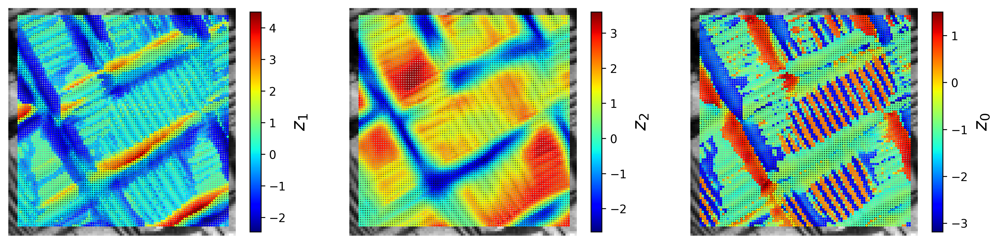

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)
ax1.imshow(patch_image, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-2], cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(patch_image, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-1], cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)

im3=ax3.imshow(patch_image, origin = "lower", cmap = 'gray')
im3=ax3.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-3], cmap = 'jet')
ax3.axis(False)
cbar3 = fig.colorbar(im3, ax=ax3, shrink=.7)
cbar3.set_label("$z_0$", fontsize=16)

Plot samplings (from different acquition functions) distribution in the latent space of all patches

In [ ]:
import pandas as pd
import seaborn as sns

z1 = np.asarray(z_mean_all, dtype = np.float32); 
z2 = np.asarray(z_mean_EI, dtype = np.float32)
d = np.append(z1, z2, axis = 0)

s = pd.DataFrame({"z0": d[:,0], "z1": d[:,1], "z2": d[:,2], "Data": 'All Data'})
s['Data'][len(z1):] = "DKL Train Data"

<ipython-input-61-5197c3e1021d>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['Data'][len(z1):] = "DKL Train Data"


In [ ]:
z_mean_all_EI, z_sd_all_EI = rvae_all.encode(vae_EI_data)
z_mean_all_MU, z_sd_all_MU = rvae_all.encode(vae_MU_data)
z_mean_all_UCB, z_sd_all_UCB = rvae_all.encode(vae_UCB_data)

f, ax = plt.subplots(figsize = (6,6), dpi = 200)

data = z1
s = pd.DataFrame({"z0": data[:,0], "z1": data[:,1], "z2": data[:,2]})
ax = sns.kdeplot(data=s, x = "z2", y = "z1", fill=True, thresh=0.01, levels=10, cmap="light:b")
# ax.set_ylim(-5, 5)
# ax.set_xlim(-5, 5)

#ax.scatter(z_mean_all[:, -1], z_mean_all[:, -2], c = 'gray', s=0.5, label = "Full patches")
ax.scatter(z_mean_all_EI[:, -1], z_mean_all_EI[:, -2], c='r', marker = 'o', s=2, label = "DKL-EI sampling")
ax.scatter(z_mean_all_MU[:, -1], z_mean_all_MU[:, -2], c='orange', marker = 'o', s=2, label = "DKL-MU sampling")
ax.scatter(z_mean_all_UCB[:, -1], z_mean_all_UCB[:, -2], c='green', marker = 'o', s=2, label = "DKL-UCB sampling")
ax.set_xlabel("$z_2$", fontsize=14)
ax.set_ylabel("$z_1$", fontsize=14)

ax.legend()